In [1]:
!pip install Twython
import pandas as pd
import numpy as np 
from twython import Twython
from twython import TwythonError
import requests
from bs4 import BeautifulSoup
from datetime import datetime
import ast
import time
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from collections import Counter
from nltk.corpus import stopwords
from nltk.util import ngrams
from sklearn.feature_extraction.text import CountVectorizer
plt.style.use('ggplot')

CONSUMER_KEY = "DyoTjohC4arsxLFBjmh71l5Fi"
CONSUMER_SECRET = "sWE3WV27dOOsZnRpSo19bZCojZykVqftYh1uAQvCwqviro4jT1"
OAUTH_TOKEN = "1133494860554604545-aQrvZDpNyxgi6MwQbHegX8Bkx6CUfI"
OAUTH_TOKEN_SECRET = "inqueIKTVIqqKGXKiHS7dOwNvSmCQdWgYN83ih1kQkNkS"
twitter = Twython(
    CONSUMER_KEY, CONSUMER_SECRET,
    OAUTH_TOKEN, OAUTH_TOKEN_SECRET)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


#  #Ουκρανία

In [2]:
tweets = []
MAX_ATTEMPTS = 50
COUNT_OF_TWEETS_TO_BE_FETCHED = 10000 

for i in range(0,MAX_ATTEMPTS):

    if(COUNT_OF_TWEETS_TO_BE_FETCHED < len(tweets)):
        print("We Got ", len(tweets), " tweets!!!")
        break # we got the  tweets... !!

    #----------------------------------------------------------------#
    # STEP 1: Query Twitter
    # STEP 2: Save the returned tweets
    # STEP 3: Get the next max_id
    #----------------------------------------------------------------#

    # STEP 1: Query Twitter
    if(0 == i):
        # Query twitter for data. 
        results = twitter.search(q="ουκρανία",count='100')
        print("I Got:", len(results['statuses']), " tweets")
    else:
        # After the first call we should have max_id from result of previous call. Pass it in query.
        results = twitter.search(q="ουκρανία",count='100', include_entities='true',max_id=next_max_id)
        print("I Got:", len(results['statuses']), " tweets")


    # STEP 2: Save the returned tweets
    for result in results['statuses']:
#        tweet_text = result['text']
        tweets.append(result)


    # STEP 3: Get the next max_id
    try:
        # Parse the data returned to get max_id to be passed in consequent call.
        next_results_url_params = results['search_metadata']['next_results']
        next_max_id = next_results_url_params.split('max_id=')[1].split('&')[0]
    except:
        # No more next pages
        break

I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets


In [3]:
#results['search_metadata']

In [4]:
#results['statuses']

In [5]:
Uk_df = pd.DataFrame(tweets)
Uk_df

,created_at,id,id_str,text,truncated,entities,metadata,source,in_reply_to_status_id,in_reply_to_status_id_str,...,retweet_count,favorite_count,favorited,retweeted,lang,possibly_sensitive,quoted_status_id,quoted_status_id_str,extended_entities,quoted_status
0,Tue Jul 05 17:52:53 +0000 2022,1544378797482545153,1544378797482545153,RT @KYTKYTKYTKYTKYT: Άλλο ένα ρεπορτάζ από το ...,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","{'iso_language_code': 'el', 'result_type': 're...","<a href=""http://twitter.com/download/android"" ...",NaN,None,...,33,0,False,False,el,NaN,NaN,NaN,NaN,NaN
1,Tue Jul 05 17:52:11 +0000 2022,1544378620944289792,1544378620944289792,RT @tosodoulittle: εντωμεταξυ στην Ουκρανία ακ...,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","{'iso_language_code': 'el', 'result_type': 're...","<a href=""http://twitter.com/download/android"" ...",NaN,None,...,1,0,False,False,el,NaN,NaN,NaN,NaN,NaN
2,Tue Jul 05 17:51:10 +0000 2022,1544378365787906056,1544378365787906056,ΧΑ: Γιατί οι τράπεζες (Πειραιώς-Eurobank) οδηγ...,True,"{'hashtags': [{'text': 'survivorGR', 'indices'...","{'iso_language_code': 'el', 'result_type': 're...","<a href=""https://contentstudio.io"" rel=""nofoll...",NaN,None,...,0,0,False,False,el,False,NaN,NaN,NaN,NaN
3,Tue Jul 05 17:51:10 +0000 2022,1544378365251125255,1544378365251125255,ΧΑ: Γιατί οι τράπεζες (Πειραιώς-Eurobank) οδηγ...,True,"{'hashtags': [{'text': 'survivorGR', 'indices'...","{'iso_language_code': 'el', 'result_type': 're...","<a href=""https://contentstudio.io"" rel=""nofoll...",NaN,None,...,0,0,False,False,el,False,NaN,NaN,NaN,NaN
4,Tue Jul 05 17:50:23 +0000 2022,1544378168462680066,1544378168462680066,ΟΙ ΕΥΡΩΠΑΙΟΙ ΗΓΕΤΕΣ ΕΓΚΛΗΜΑΤΟΥΝ ΚΑΤΑ ΤΩΝ ΛΑΩΝ ...,True,"{'hashtags': [], 'symbols': [], 'user_mentions...","{'iso_language_code': 'el', 'result_type': 're...","<a href=""https://mobile.twitter.com"" rel=""nofo...",NaN,None,...,0,0,False,False,el,False,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,Sun Jul 03 07:57:20 +0000 2022,1543504148229922818,1543504148229922818,...#Πολεμος_στην_Ουκρανια #οικονομια #greece #...,False,{'hashtags': [{'text': 'Πολεμος_στην_Ουκρανια'...,"{'iso_language_code': 'und', 'result_type': 'r...","<a href=""https://contentstudio.io"" rel=""nofoll...",1.543504e+18,1543504146548117505,...,0,0,False,False,und,NaN,NaN,NaN,NaN,NaN
4996,Sun Jul 03 07:57:11 +0000 2022,1543504109239734273,1543504109239734273,...#πανδημια #survivorGR #Πολεμος_στην_Ουκρανια,False,"{'hashtags': [{'text': 'πανδημια', 'indices': ...","{'iso_language_code': 'und', 'result_type': 'r...","<a href=""https://contentstudio.io"" rel=""nofoll...",1.543504e+18,1543504108035899392,...,0,0,False,False,und,NaN,NaN,NaN,NaN,NaN
4997,Sun Jul 03 07:56:57 +0000 2022,1543504051857416192,1543504051857416192,#Ukraine #Ουκρανία #Україна https://t.co/McStG...,False,"{'hashtags': [{'text': 'Ukraine', 'indices': [...","{'iso_language_code': 'und', 'result_type': 'r...","<a href=""https://mobile.twitter.com"" rel=""nofo...",NaN,None,...,0,0,False,False,und,False,1.543262e+18,1543262247413325825,NaN,{'created_at': 'Sat Jul 02 15:56:06 +0000 2022...
4998,Sun Jul 03 07:56:32 +0000 2022,1543503945863159811,1543503945863159811,RT @AnAthenianToLDN: Η Ουκρανία πλέον έχει πυρ...,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","{'iso_language_code': 'el', 'result_type': 're...","<a href=""http://twitter.com/download/android"" ...",NaN,None,...,15,0,False,False,el,NaN,NaN,NaN,NaN,NaN


In [6]:
# Number of tweets the user has made
print("I got :", len(Uk_df), " in total!!!")

I got : 5000  in total!!!


In [7]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [8]:
Uk_df.to_csv("/content/gdrive/My Drive/Colab Notebooks/Ουκρανία_tweet.tsv", sep='\t')

# Νέα ενότητα #Ουκρανία

In [9]:
Uk = Uk_df[['created_at','text' ]]
Uk = Uk.rename(columns={'created_at': 'date'} )
Uk

,date,text
0,Tue Jul 05 17:52:53 +0000 2022,RT @KYTKYTKYTKYTKYT: Άλλο ένα ρεπορτάζ από το ...
1,Tue Jul 05 17:52:11 +0000 2022,RT @tosodoulittle: εντωμεταξυ στην Ουκρανία ακ...
2,Tue Jul 05 17:51:10 +0000 2022,ΧΑ: Γιατί οι τράπεζες (Πειραιώς-Eurobank) οδηγ...
3,Tue Jul 05 17:51:10 +0000 2022,ΧΑ: Γιατί οι τράπεζες (Πειραιώς-Eurobank) οδηγ...
4,Tue Jul 05 17:50:23 +0000 2022,ΟΙ ΕΥΡΩΠΑΙΟΙ ΗΓΕΤΕΣ ΕΓΚΛΗΜΑΤΟΥΝ ΚΑΤΑ ΤΩΝ ΛΑΩΝ ...
...,...,...
4995,Sun Jul 03 07:57:20 +0000 2022,...#Πολεμος_στην_Ουκρανια #οικονομια #greece #...
4996,Sun Jul 03 07:57:11 +0000 2022,...#πανδημια #survivorGR #Πολεμος_στην_Ουκρανια
4997,Sun Jul 03 07:56:57 +0000 2022,#Ukraine #Ουκρανία #Україна https://t.co/McStG...
4998,Sun Jul 03 07:56:32 +0000 2022,RT @AnAthenianToLDN: Η Ουκρανία πλέον έχει πυρ...


In [10]:
Uk.dtypes

date    object
text    object
dtype: object

In [11]:
Uk['year'] = pd.DatetimeIndex(Uk['date']).year
Uk['month'] = pd.DatetimeIndex(Uk['date']).month
Uk['day'] = pd.DatetimeIndex(Uk['date']).day
Uk

,date,text,year,month,day
0,Tue Jul 05 17:52:53 +0000 2022,RT @KYTKYTKYTKYTKYT: Άλλο ένα ρεπορτάζ από το ...,2022,7,5
1,Tue Jul 05 17:52:11 +0000 2022,RT @tosodoulittle: εντωμεταξυ στην Ουκρανία ακ...,2022,7,5
2,Tue Jul 05 17:51:10 +0000 2022,ΧΑ: Γιατί οι τράπεζες (Πειραιώς-Eurobank) οδηγ...,2022,7,5
3,Tue Jul 05 17:51:10 +0000 2022,ΧΑ: Γιατί οι τράπεζες (Πειραιώς-Eurobank) οδηγ...,2022,7,5
4,Tue Jul 05 17:50:23 +0000 2022,ΟΙ ΕΥΡΩΠΑΙΟΙ ΗΓΕΤΕΣ ΕΓΚΛΗΜΑΤΟΥΝ ΚΑΤΑ ΤΩΝ ΛΑΩΝ ...,2022,7,5
...,...,...,...,...,...
4995,Sun Jul 03 07:57:20 +0000 2022,...#Πολεμος_στην_Ουκρανια #οικονομια #greece #...,2022,7,3
4996,Sun Jul 03 07:57:11 +0000 2022,...#πανδημια #survivorGR #Πολεμος_στην_Ουκρανια,2022,7,3
4997,Sun Jul 03 07:56:57 +0000 2022,#Ukraine #Ουκρανία #Україна https://t.co/McStG...,2022,7,3
4998,Sun Jul 03 07:56:32 +0000 2022,RT @AnAthenianToLDN: Η Ουκρανία πλέον έχει πυρ...,2022,7,3


In [12]:
Uk['text'] = Uk['text'].str.replace(r'https?:\/\/.*[\r\n]*'," ")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  """Entry point for launching an IPython kernel.


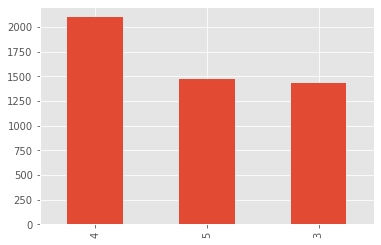

In [13]:
Uk['day'].value_counts().plot(kind='bar')

In [14]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

In [15]:
Uk[Uk['year']==2022]['text']

0       RT @KYTKYTKYTKYTKYT: Άλλο ένα ρεπορτάζ από το ...
1       RT @tosodoulittle: εντωμεταξυ στην Ουκρανία ακ...
2       ΧΑ: Γιατί οι τράπεζες (Πειραιώς-Eurobank) οδηγ...
3       ΧΑ: Γιατί οι τράπεζες (Πειραιώς-Eurobank) οδηγ...
4       ΟΙ ΕΥΡΩΠΑΙΟΙ ΗΓΕΤΕΣ ΕΓΚΛΗΜΑΤΟΥΝ ΚΑΤΑ ΤΩΝ ΛΑΩΝ ...
                              ...                        
4995    ...#Πολεμος_στην_Ουκρανια #οικονομια #greece #...
4996      ...#πανδημια #survivorGR #Πολεμος_στην_Ουκρανια
4997                        #Ukraine #Ουκρανία #Україна  
4998    RT @AnAthenianToLDN: Η Ουκρανία πλέον έχει πυρ...
4999    RT @fax_you: -πόσο έχει το πιτόγυρο?\n-4€\n-γι...
Name: text, Length: 5000, dtype: object

In [16]:
# Ισως καποτε χρειαστεί να αφαιρέσουμε τους τόνους.....
text = Uk['text'].str.replace('ά','α').str.replace("έ", "ε").str.replace('ή','η').str.replace('ί','ι').str.replace('ό','ο').str.replace('ύ','υ').str.replace('ώ','ω')

In [17]:
text = Uk[Uk['year']==2022]['text'].str.cat(sep = '.').replace("amp", ' ')
text

'RT @KYTKYTKYTKYTKYT: Άλλο ένα ρεπορτάζ από το France 24 από το Lisichansk. Αυτή τη φορά μετά την απελευθέρωση της πόλης.μΓάλλοι δημοσιογράφ….RT @tosodoulittle: εντωμεταξυ στην Ουκρανία ακομα πολεμανε 4.5 μηνες μετά.ΧΑ: Γιατί οι τράπεζες (Πειραιώς-Eurobank) οδηγούν την πτώση  .ΧΑ: Γιατί οι τράπεζες (Πειραιώς-Eurobank) οδηγούν την πτώση  .ΟΙ ΕΥΡΩΠΑΙΟΙ ΗΓΕΤΕΣ ΕΓΚΛΗΜΑΤΟΥΝ ΚΑΤΑ ΤΩΝ ΛΑΩΝ ΤΟΥΣ: ΑΝΤΙ ΝΑ ΠΙΕΣΟΥΝ ΤΟΝ ΖΕΛΕΝΣΚΥ ΝΑ ΣΥΝΘΗΚΟΛΟΓΗΣΕΙ,ΤΟΥ ΣΤΕΛΝΟΥΝ ΟΠΛ…  .RT @pokopiko11: @g_efthimiadis @citizennick1 Η Ιταλία ως καθολική δεν συντάχθηκε με την Ουκρανία!!!.RT @EEmerson14: Οι Τσετσένοι σύμμαχοι του Πούτιν  πολεμούν στην Ουκρανία  για την τζιχάντ.  🤔.RT @AntiwarRawitna: Πολλαπλασιάζονται οι ενδείξεις ότι η Αγκυρα εξαναγκάζεται σε κινήσεις, που υπό άλλες συνθήκες θα είχε αποφύγει. Ο πόλεμ….Ουκρανία: Οι κάτοικοι της Μαριούπολης λαμβάνουν 5 λίτρα πόσιμου νερού την εβδομάδα -  .RT @NataliGlezou: Φαντάσου να μπει στην Ε.Ε η Ουκρανία και οι Ναζί να φυλούν τα σύνορα Ευρώπης. Φαντάσου προσβολή στο ε

In [18]:
list(STOPWORDS)[0:20]

['me',
 "shouldn't",
 "you're",
 "he'll",
 'themselves',
 'our',
 'over',
 'same',
 'when',
 "it's",
 'having',
 'how',
 'who',
 'out',
 'was',
 'few',
 'myself',
 'he',
 'very',
 'could']

In [19]:
import spacy
!python -m spacy download el_core_news_sm

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 12.6 MB 7.3 MB/s 
✔ Download and installation successful
You can now load the package via spacy.load('el_core_news_sm')


In [20]:
nlp = spacy.load('el_core_news_sm')
list(nlp.Defaults.stop_words)[0:20]

['αναμεταξύ',
 'πρόπερσι',
 'την',
 'άλλη',
 'ήδη',
 'όλους',
 'δεξιά',
 'παρά',
 'πρώτες',
 'ετούτες',
 'καθένας',
 'τώρα',
 'εν',
 'τέτοιας',
 'μιαν',
 'εφεξής',
 'τέτοιο',
 'προχθές',
 'τους',
 'ήτανε']

In [21]:
text = Uk['text'].str.cat(sep = '.').replace('.','').strip()
text = text.replace('amp','').strip()
text = text.replace('rt','').strip()
text = text.replace('\n','').strip()
text = text.replace(':','').strip()
text

'RT @KYTKYTKYTKYTKYT Άλλο ένα ρεπορτάζ από το France 24 από το Lisichansk Αυτή τη φορά μετά την απελευθέρωση της πόληςμΓάλλοι δημοσιογράφ…RT @tosodoulittle εντωμεταξυ στην Ουκρανία ακομα πολεμανε 45 μηνες μετάΧΑ Γιατί οι τράπεζες (Πειραιώς-Eurobank) οδηγούν την πτώση  ΧΑ Γιατί οι τράπεζες (Πειραιώς-Eurobank) οδηγούν την πτώση  ΟΙ ΕΥΡΩΠΑΙΟΙ ΗΓΕΤΕΣ ΕΓΚΛΗΜΑΤΟΥΝ ΚΑΤΑ ΤΩΝ ΛΑΩΝ ΤΟΥΣ ΑΝΤΙ ΝΑ ΠΙΕΣΟΥΝ ΤΟΝ ΖΕΛΕΝΣΚΥ ΝΑ ΣΥΝΘΗΚΟΛΟΓΗΣΕΙ,ΤΟΥ ΣΤΕΛΝΟΥΝ ΟΠΛ…  RT @pokopiko11 @g_efthimiadis @citizennick1 Η Ιταλία ως καθολική δεν συντάχθηκε με την Ουκρανία!!!RT @EEmerson14 Οι Τσετσένοι σύμμαχοι του Πούτιν  πολεμούν στην Ουκρανία  για την τζιχάντ  🤔RT @AntiwarRawitna Πολλαπλασιάζονται οι ενδείξεις ότι η Αγκυρα εξαναγκάζεται σε κινήσεις, που υπό άλλες συνθήκες θα είχε αποφύγει Ο πόλεμ…Ουκρανία Οι κάτοικοι της Μαριούπολης λαμβάνουν 5 λίτρα πόσιμου νερού την εβδομάδα -  RT @NataliGlezou Φαντάσου να μπει στην ΕΕ η Ουκρανία και οι Ναζί να φυλούν τα σύνορα Ευρώπης Φαντάσου προσβολή στο ελληνικό κοινοβούλιο…RT @KY

In [22]:
from PIL import Image
import numpy as np

In [23]:
doc = nlp(Uk['text'][1])

In [24]:
for token in doc:
    print(token, token.lemma_)

RT RT
@tosodoulittle @tosodoulittle
: :
εντωμεταξυ εντωμεταξυ
στην σε ο
Ουκρανία Ουκρανία
ακομα ακομα
πολεμανε πολεμανε
4.5 4.5
μηνες μηνες
μετά μετά


In [25]:
' '.join(token.lemma_ for token in doc)
text

'RT @KYTKYTKYTKYTKYT Άλλο ένα ρεπορτάζ από το France 24 από το Lisichansk Αυτή τη φορά μετά την απελευθέρωση της πόληςμΓάλλοι δημοσιογράφ…RT @tosodoulittle εντωμεταξυ στην Ουκρανία ακομα πολεμανε 45 μηνες μετάΧΑ Γιατί οι τράπεζες (Πειραιώς-Eurobank) οδηγούν την πτώση  ΧΑ Γιατί οι τράπεζες (Πειραιώς-Eurobank) οδηγούν την πτώση  ΟΙ ΕΥΡΩΠΑΙΟΙ ΗΓΕΤΕΣ ΕΓΚΛΗΜΑΤΟΥΝ ΚΑΤΑ ΤΩΝ ΛΑΩΝ ΤΟΥΣ ΑΝΤΙ ΝΑ ΠΙΕΣΟΥΝ ΤΟΝ ΖΕΛΕΝΣΚΥ ΝΑ ΣΥΝΘΗΚΟΛΟΓΗΣΕΙ,ΤΟΥ ΣΤΕΛΝΟΥΝ ΟΠΛ…  RT @pokopiko11 @g_efthimiadis @citizennick1 Η Ιταλία ως καθολική δεν συντάχθηκε με την Ουκρανία!!!RT @EEmerson14 Οι Τσετσένοι σύμμαχοι του Πούτιν  πολεμούν στην Ουκρανία  για την τζιχάντ  🤔RT @AntiwarRawitna Πολλαπλασιάζονται οι ενδείξεις ότι η Αγκυρα εξαναγκάζεται σε κινήσεις, που υπό άλλες συνθήκες θα είχε αποφύγει Ο πόλεμ…Ουκρανία Οι κάτοικοι της Μαριούπολης λαμβάνουν 5 λίτρα πόσιμου νερού την εβδομάδα -  RT @NataliGlezou Φαντάσου να μπει στην ΕΕ η Ουκρανία και οι Ναζί να φυλούν τα σύνορα Ευρώπης Φαντάσου προσβολή στο ελληνικό κοινοβούλιο…RT @KY

In [26]:
full_doc = nlp(text)

In [27]:
clear_text = ' '.join(token.lemma_ for token in full_doc)
clear_text[200:400]

' μετάΧΑ Γιατί ο τράπεζα ( πειραιώς - Eurobank ) οδηγώ ο πτώση   ΧΑ γιατί ο τράπεζα ( πειραιώς - Eurobank ) οδηγώ ο πτώση   ΟΙ ΕΥΡΩΠΑΙΟΙ ΗΓΕΤΕΣ ΕΓΚΛΗΜΑΤΟΥΝ ΚΑΤΑ ΤΩΝ ΛΑΩΝ ΤΟΥΣ ΑΝΤΙ ΝΑ ΠΙΕΣΟΥΝ ΤΟΝ ΖΕΛΕΝΣ'

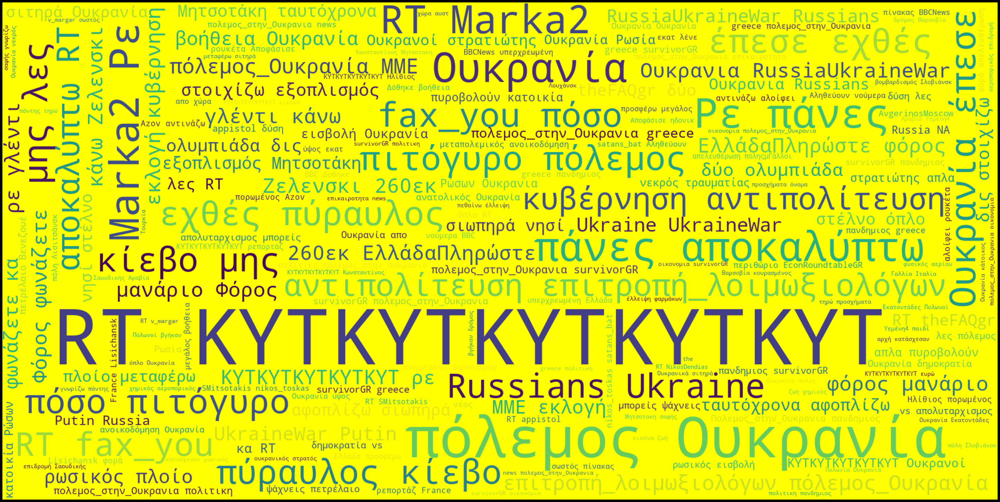

In [28]:
wordcloud = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    width = 2000,
    height = 1000,
    background_color = 'yellow'
 ).generate(clear_text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [29]:
from collections import Counter
Counter(" ".join(Uk["text"]).split()).most_common(16)

[('RT', 2381),
 ('στην', 1588),
 ('το', 1300),
 ('την', 1246),
 ('και', 1062),
 ('Ουκρανία', 972),
 ('από', 968),
 ('του', 960),
 ('να', 943),
 ('της', 927),
 ('@KYTKYTKYTKYTKYT:', 914),
 ('η', 889),
 ('με', 761),
 ('για', 761),
 ('στο', 652),
 ('που', 644)]

In [30]:
for word in nlp.Defaults.stop_words:
  print(word)
  break

αναμεταξύ


In [31]:
Uk['text_no_stopwords'] = Uk['text'].apply(lambda x: ' '.join([word for word in x.split() if word not in (nlp.Defaults.stop_words) and word != ':' and word != '\n' and word != "amp" and word != 'rt' and word != ',']))
Uk['text_no_stopwords'] = Uk['text'].apply(lambda x: ' '.join([word for word in x.split() if word not in (nlp.Defaults.stop_words)]))
Uk['clean_text_no_stopwords'] = Uk['text']
#for stopword in nlp.Defaults.stop_words:
Uk['clean_text_no_stopwords'] = Uk['clean_text_no_stopwords'].apply(lambda x: ' '.join([word for word in x.split() if word not in nlp.Defaults.stop_words and word != "ή" and word != "ία" and word != "κι"]))
Uk['clean_text_no_stopwords'] = Uk['clean_text_no_stopwords'].apply(lambda x: x.replace("amp", "").strip())
Uk['clean_text_no_stopwords'] = Uk['clean_text_no_stopwords'].apply(lambda x: x.replace("rt", "").strip())
Uk['clean_text_no_stopwords'] = Uk['clean_text_no_stopwords'].apply(lambda x: x.replace(":", "").strip())
Uk['clean_text_no_stopwords'] = Uk['clean_text_no_stopwords'].apply(lambda x: x.replace(",", "").strip())
Uk['clean_text_no_stopwords'] = Uk['clean_text_no_stopwords'].apply(lambda x: x.replace("\n", "").strip())
Uk['clean_text_no_stopwords'] = Uk['clean_text_no_stopwords'].apply(lambda x: x.replace(".", "").strip())

In [32]:
freq = Counter(" ".join(Uk["clean_text_no_stopwords"]).split()).most_common(16)
freq

[('RT', 2384),
 ('Ουκρανία', 1826),
 ('@KYTKYTKYTKYTKYT', 935),
 ('Η', 579),
 ('#Πολεμος_στην_Ουκρανια', 439),
 ('Ο', 344),
 ('#survivorGR', 323),
 ('#πανδημια', 321),
 ('-', 319),
 ('#greece', 303),
 ('#Ουκρανια', 277),
 ('#πολιτικη', 244),
 ('πόλεμος', 237),
 ('#οικονομια', 234),
 ('Οι', 208),
 ('Ελλάδα', 201)]

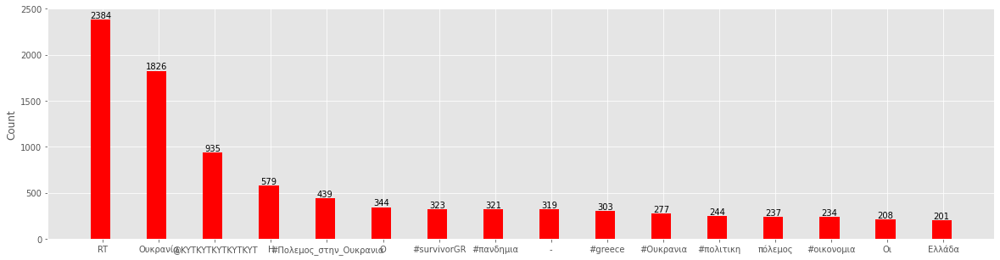

In [33]:
names, values = zip(*freq)
# names = [x[0] for x in data]  # These two lines are equivalent to the the zip-command.
# values = [x[1] for x in data] # These two lines are equivalent to the the zip-command.

ind = np.arange(len(freq))  # the x locations for the groups
width = 0.35       # the width of the bars

fig, ax = plt.subplots(figsize=(20,5))
rects1 = ax.bar(ind, values, width, color='r')
# add some text for labels, title and axes ticks
ax.set_ylabel('Count')
ax.set_xticks(ind+width/10.)
ax.set_xticklabels(names)

def autolabel(rects):
    # attach some text labels
    for rect in rects:
        height = rect.get_height()
        ax.text(rect.get_x() + rect.get_width()/2, height,
                '%d' % int(height),
                ha='center', va='bottom')

autolabel(rects1)

plt.show()

# Emolex Ουκρανία

In [34]:
filepath = "https://raw.githubusercontent.com/datajour-gr/Data_journalism/master/week10/NRC_GREEK_Translated_6_2020.csv"
emolex_df = pd.read_csv(filepath)
emolex_df.head()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
0,αφεση,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,ενορκη βεβαιωση,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,εχοντας,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,εχω,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,οριο,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [35]:
emolex_df.tail()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
13166,ουρλιασμα,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
13167,κροκος αυγου,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13168,νεοτερος,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13169,ζεφυρος,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13170,ζουμ,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [36]:
emolex_df = emolex_df.drop_duplicates(subset=['word'])
emolex_df = emolex_df.dropna()
emolex_df.reset_index(drop = True, inplace = True)

In [37]:
emolex_df.tail()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
13156,ουρλιασμα,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
13157,κροκος αυγου,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13158,νεοτερος,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13159,ζεφυρος,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13160,ζουμ,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [38]:
import spacy
nlp = spacy.load('el_core_news_sm')

In [39]:
len(Uk)
Uk

,date,text,year,month,day,text_no_stopwords,clean_text_no_stopwords
0,Tue Jul 05 17:52:53 +0000 2022,RT @KYTKYTKYTKYTKYT: Άλλο ένα ρεπορτάζ από το ...,2022,7,5,RT @KYTKYTKYTKYTKYT: Άλλο ρεπορτάζ France 24 L...,RT @KYTKYTKYTKYTKYT Άλλο ρεπορτάζ France 24 Li...
1,Tue Jul 05 17:52:11 +0000 2022,RT @tosodoulittle: εντωμεταξυ στην Ουκρανία ακ...,2022,7,5,RT @tosodoulittle: εντωμεταξυ Ουκρανία ακομα π...,RT @tosodoulittle εντωμεταξυ Ουκρανία ακομα πο...
2,Tue Jul 05 17:51:10 +0000 2022,ΧΑ: Γιατί οι τράπεζες (Πειραιώς-Eurobank) οδηγ...,2022,7,5,ΧΑ: Γιατί τράπεζες (Πειραιώς-Eurobank) οδηγούν...,ΧΑ Γιατί τράπεζες (Πειραιώς-Eurobank) οδηγούν ...
3,Tue Jul 05 17:51:10 +0000 2022,ΧΑ: Γιατί οι τράπεζες (Πειραιώς-Eurobank) οδηγ...,2022,7,5,ΧΑ: Γιατί τράπεζες (Πειραιώς-Eurobank) οδηγούν...,ΧΑ Γιατί τράπεζες (Πειραιώς-Eurobank) οδηγούν ...
4,Tue Jul 05 17:50:23 +0000 2022,ΟΙ ΕΥΡΩΠΑΙΟΙ ΗΓΕΤΕΣ ΕΓΚΛΗΜΑΤΟΥΝ ΚΑΤΑ ΤΩΝ ΛΑΩΝ ...,2022,7,5,ΟΙ ΕΥΡΩΠΑΙΟΙ ΗΓΕΤΕΣ ΕΓΚΛΗΜΑΤΟΥΝ ΚΑΤΑ ΤΩΝ ΛΑΩΝ ...,ΟΙ ΕΥΡΩΠΑΙΟΙ ΗΓΕΤΕΣ ΕΓΚΛΗΜΑΤΟΥΝ ΚΑΤΑ ΤΩΝ ΛΑΩΝ ...
...,...,...,...,...,...,...,...
4995,Sun Jul 03 07:57:20 +0000 2022,...#Πολεμος_στην_Ουκρανια #οικονομια #greece #...,2022,7,3,...#Πολεμος_στην_Ουκρανια #οικονομια #greece #...,#Πολεμος_στην_Ουκρανια #οικονομια #greece #επι...
4996,Sun Jul 03 07:57:11 +0000 2022,...#πανδημια #survivorGR #Πολεμος_στην_Ουκρανια,2022,7,3,...#πανδημια #survivorGR #Πολεμος_στην_Ουκρανια,#πανδημια #survivorGR #Πολεμος_στην_Ουκρανια
4997,Sun Jul 03 07:56:57 +0000 2022,#Ukraine #Ουκρανία #Україна,2022,7,3,#Ukraine #Ουκρανία #Україна,#Ukraine #Ουκρανία #Україна
4998,Sun Jul 03 07:56:32 +0000 2022,RT @AnAthenianToLDN: Η Ουκρανία πλέον έχει πυρ...,2022,7,3,RT @AnAthenianToLDN: Η Ουκρανία πυροβόλα 105mm...,RT @AnAthenianToLDN Η Ουκρανία πυροβόλα 105mm ...


In [40]:
#short_tweets_Ukr = Uk[['created_at','full_text' ]]
#short_tweets_Ukr = short_tweets_Ukr.rename(columns={'created_at': 'date', 'full_text': 'text'} )

In [41]:
short_tweets_Ukr = Uk[['date','text' ]]

short_tweets_Ukr

,date,text
0,Tue Jul 05 17:52:53 +0000 2022,RT @KYTKYTKYTKYTKYT: Άλλο ένα ρεπορτάζ από το ...
1,Tue Jul 05 17:52:11 +0000 2022,RT @tosodoulittle: εντωμεταξυ στην Ουκρανία ακ...
2,Tue Jul 05 17:51:10 +0000 2022,ΧΑ: Γιατί οι τράπεζες (Πειραιώς-Eurobank) οδηγ...
3,Tue Jul 05 17:51:10 +0000 2022,ΧΑ: Γιατί οι τράπεζες (Πειραιώς-Eurobank) οδηγ...
4,Tue Jul 05 17:50:23 +0000 2022,ΟΙ ΕΥΡΩΠΑΙΟΙ ΗΓΕΤΕΣ ΕΓΚΛΗΜΑΤΟΥΝ ΚΑΤΑ ΤΩΝ ΛΑΩΝ ...
...,...,...
4995,Sun Jul 03 07:57:20 +0000 2022,...#Πολεμος_στην_Ουκρανια #οικονομια #greece #...
4996,Sun Jul 03 07:57:11 +0000 2022,...#πανδημια #survivorGR #Πολεμος_στην_Ουκρανια
4997,Sun Jul 03 07:56:57 +0000 2022,#Ukraine #Ουκρανία #Україна
4998,Sun Jul 03 07:56:32 +0000 2022,RT @AnAthenianToLDN: Η Ουκρανία πλέον έχει πυρ...


In [42]:
short_tweets_Ukr.tail()

,date,text
4995,Sun Jul 03 07:57:20 +0000 2022,...#Πολεμος_στην_Ουκρανια #οικονομια #greece #...
4996,Sun Jul 03 07:57:11 +0000 2022,...#πανδημια #survivorGR #Πολεμος_στην_Ουκρανια
4997,Sun Jul 03 07:56:57 +0000 2022,#Ukraine #Ουκρανία #Україна
4998,Sun Jul 03 07:56:32 +0000 2022,RT @AnAthenianToLDN: Η Ουκρανία πλέον έχει πυρ...
4999,Sun Jul 03 07:55:14 +0000 2022,RT @fax_you: -πόσο έχει το πιτόγυρο?\n-4€\n-γι...


In [43]:
short_tweets_Ukr.dtypes

date    object
text    object
dtype: object

In [44]:
short_tweets_Ukr['date'] = pd.to_datetime(short_tweets_Ukr['date'], format='%a %b %d %H:%M:%S +0000 %Y')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [45]:
short_tweets_Ukr['year'] = pd.DatetimeIndex(short_tweets_Ukr['date']).year
short_tweets_Ukr['month'] = pd.DatetimeIndex(short_tweets_Ukr['date']).month
short_tweets_Ukr['day'] = pd.DatetimeIndex(short_tweets_Ukr['date']).day
short_tweets_Ukr

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

,date,text,year,month,day
0,2022-07-05 17:52:53,RT @KYTKYTKYTKYTKYT: Άλλο ένα ρεπορτάζ από το ...,2022,7,5
1,2022-07-05 17:52:11,RT @tosodoulittle: εντωμεταξυ στην Ουκρανία ακ...,2022,7,5
2,2022-07-05 17:51:10,ΧΑ: Γιατί οι τράπεζες (Πειραιώς-Eurobank) οδηγ...,2022,7,5
3,2022-07-05 17:51:10,ΧΑ: Γιατί οι τράπεζες (Πειραιώς-Eurobank) οδηγ...,2022,7,5
4,2022-07-05 17:50:23,ΟΙ ΕΥΡΩΠΑΙΟΙ ΗΓΕΤΕΣ ΕΓΚΛΗΜΑΤΟΥΝ ΚΑΤΑ ΤΩΝ ΛΑΩΝ ...,2022,7,5
...,...,...,...,...,...
4995,2022-07-03 07:57:20,...#Πολεμος_στην_Ουκρανια #οικονομια #greece #...,2022,7,3
4996,2022-07-03 07:57:11,...#πανδημια #survivorGR #Πολεμος_στην_Ουκρανια,2022,7,3
4997,2022-07-03 07:56:57,#Ukraine #Ουκρανία #Україна,2022,7,3
4998,2022-07-03 07:56:32,RT @AnAthenianToLDN: Η Ουκρανία πλέον έχει πυρ...,2022,7,3


In [46]:
short_tweets_Ukr.dtypes

date     datetime64[ns]
text             object
year              int64
month             int64
day               int64
dtype: object

In [47]:
emolex_df['word'].head(3)

0              αφεση
1    ενορκη βεβαιωση
2            εχοντας
Name: word, dtype: object

In [48]:
short_tweets_Ukr['text'] = short_tweets_Ukr['text'].str.replace(r'https?:\/\/.*[\r\n]*'," ")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [49]:
short_tweets_Ukr.head()

,date,text,year,month,day
0,2022-07-05 17:52:53,RT @KYTKYTKYTKYTKYT: Άλλο ένα ρεπορτάζ από το ...,2022,7,5
1,2022-07-05 17:52:11,RT @tosodoulittle: εντωμεταξυ στην Ουκρανία ακ...,2022,7,5
2,2022-07-05 17:51:10,ΧΑ: Γιατί οι τράπεζες (Πειραιώς-Eurobank) οδηγ...,2022,7,5
3,2022-07-05 17:51:10,ΧΑ: Γιατί οι τράπεζες (Πειραιώς-Eurobank) οδηγ...,2022,7,5
4,2022-07-05 17:50:23,ΟΙ ΕΥΡΩΠΑΙΟΙ ΗΓΕΤΕΣ ΕΓΚΛΗΜΑΤΟΥΝ ΚΑΤΑ ΤΩΝ ΛΑΩΝ ...,2022,7,5


In [50]:
vec = CountVectorizer(analyzer = 'word', vocabulary = emolex_df.word, 
                      strip_accents = 'unicode',  
                      stop_words= nlp.Defaults.stop_words,
                      ngram_range=(1, 2))

In [51]:
#from sklearn.feature_extraction.text import TfidfVectorizer
#CountVectorizer(stop_words='english', binary=True)
# Θέλω να ελέγξω μόνο τις λέξεις που υπάρχουν στο συναισθηματικό λεξικό

#CountVectorizer(analyzer = 'word', 
#              strip_accents = 'unicode', 
#               token_pattern='[Α-Ωα-ωΆ-Ώά-ώ]{2,}', 
#               stop_words= lc_stop_words_df['stop_w'].tolist())


matrix = vec.fit_transform(short_tweets_Ukr['text'])
vocab = vec.get_feature_names()
wordcount_df = pd.DataFrame(matrix.toarray(), columns=vocab)
wordcount_df.head()

/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:1323: UserWarning: Upper case characters found in vocabulary while 'lowercase' is True. These entries will not be matched with any documents
  "Upper case characters found in"
/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:401: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['αδιακοπα', 'ακομα', 'ακομη', 'ακριβως', 'αλλα', 'αλλαχου', 'αλλες', 'αλλη', 'αλλην', 'αλλης', 'αλλιως', 'αλλιωτικα', 'αλλο', 'αλλοι', 'αλλοιως', 'αλλοιωτικα', 'αλλον', 'αλλος', 'αλλοτε', 'αλλου', 'αλλους', 'αλλων', 'αμα', 'αμεσα', 'αμεσως', 'ανα', 'αναμεσα', 'αναμεταξυ', 'ανευ', 'αντι', 'αντιπερα', 'αντις', 'ανω', 'ανωτερω', 'αξαφνα', 'απεναντι', 'απο', 'αποψε', 'αρα', 'αραγε', 'αρκετα', 'αρκετες', 'αρχικα', 'αυριο', 'αυτα', 'αυτες', 'αυτη', 'αυτην', 'αυτης', 'αυτο', 'αυτοι', 'αυτον', 'αυτος', 'αυτου', 'αυτους', 'αυτων', 'αφοτου', 'αφου', 'βεβαια

,αφεση,ενορκη βεβαιωση,εχοντας,εχω,οριο,ορμος,υδρα,αγια τραπεζα,αμην,απατσι,...,κλητηριο ενταλμα,κατειργασμενος,μαγια,κιτρινο,κιτρινιζω,ουρλιασμα,κροκος αυγου,νεοτερος,ζεφυρος,ζουμ
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [52]:
wordcount_df.shape

(5000, 13161)

In [53]:
emolex_df.head()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
0,αφεση,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,ενορκη βεβαιωση,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,εχοντας,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,εχω,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,οριο,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [54]:
emolex_df[emolex_df.Anger == 1].tail()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
13094,διεξοδος,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13096,ζωυφια,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
13100,θυματοποιω,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0
13128,αποτυχημενος,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
13156,ουρλιασμα,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [55]:
# Φτιάξε μια λίστα με positive words

angry_words = emolex_df[emolex_df.Anger == 1]['word']

positive_words = emolex_df[emolex_df.Positive == 1]['word']


# Φτιάξε μια λίστα με sadness words
sadness_words = emolex_df[emolex_df.Sadness == 1]['word']


# Φτιάξε μια λίστα με surprise words
surprise_words = emolex_df[emolex_df.Surprise == 1]['word']


# Φτιάξε μια λίστα με disgust words
disgust_words = emolex_df[emolex_df.Disgust == 1]['word']


# Φτιάξε μια λίστα με anticipation words
anticipation_words = emolex_df[emolex_df.Anticipation == 1]['word']


# Φτιάξε μια λίστα με negative words
negative_words = emolex_df[emolex_df.Negative == 1]['word']



# Φτιάξε μια λίστα με joy words
joy_words = emolex_df[emolex_df.Joy == 1]['word']


# Φτιάξε μια λίστα με trust words
trust_words = emolex_df[emolex_df.Trust == 1]['word']



# Φτιάξε μια λίστα με fear words
fear_words = emolex_df[emolex_df.Fear == 1]['word']


In [56]:
short_tweets_Ukr.head(3)

,date,text,year,month,day
0,2022-07-05 17:52:53,RT @KYTKYTKYTKYTKYT: Άλλο ένα ρεπορτάζ από το ...,2022,7,5
1,2022-07-05 17:52:11,RT @tosodoulittle: εντωμεταξυ στην Ουκρανία ακ...,2022,7,5
2,2022-07-05 17:51:10,ΧΑ: Γιατί οι τράπεζες (Πειραιώς-Eurobank) οδηγ...,2022,7,5


In [57]:
short_tweets_Ukr['anger'] = wordcount_df[angry_words].sum(axis=1)

short_tweets_Ukr['positivity'] = wordcount_df[positive_words].sum(axis=1)


short_tweets_Ukr['joy'] = wordcount_df[joy_words].sum(axis=1)


short_tweets_Ukr['disgust'] = wordcount_df[disgust_words].sum(axis=1)


short_tweets_Ukr['surprise'] = wordcount_df[surprise_words].sum(axis=1)

short_tweets_Ukr['trust'] = wordcount_df[trust_words].sum(axis=1)


short_tweets_Ukr['anticipation'] = wordcount_df[anticipation_words].sum(axis=1)


short_tweets_Ukr['sadness'] = wordcount_df[sadness_words].sum(axis=1)

short_tweets_Ukr['negative'] = wordcount_df[negative_words].sum(axis=1)

short_tweets_Ukr['fear'] = wordcount_df[fear_words].sum(axis=1)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [58]:
short_tweets_Ukr

,date,text,year,month,day,anger,positivity,joy,disgust,surprise,trust,anticipation,sadness,negative,fear
0,2022-07-05 17:52:53,RT @KYTKYTKYTKYTKYT: Άλλο ένα ρεπορτάζ από το ...,2022,7,5,0,1,1,0,1,0,1,0,0,0
1,2022-07-05 17:52:11,RT @tosodoulittle: εντωμεταξυ στην Ουκρανία ακ...,2022,7,5,0,0,0,0,0,0,0,0,0,0
2,2022-07-05 17:51:10,ΧΑ: Γιατί οι τράπεζες (Πειραιώς-Eurobank) οδηγ...,2022,7,5,0,0,0,1,0,0,0,1,1,0
3,2022-07-05 17:51:10,ΧΑ: Γιατί οι τράπεζες (Πειραιώς-Eurobank) οδηγ...,2022,7,5,0,0,0,1,0,0,0,1,1,0
4,2022-07-05 17:50:23,ΟΙ ΕΥΡΩΠΑΙΟΙ ΗΓΕΤΕΣ ΕΓΚΛΗΜΑΤΟΥΝ ΚΑΤΑ ΤΩΝ ΛΑΩΝ ...,2022,7,5,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2022-07-03 07:57:20,...#Πολεμος_στην_Ουκρανια #οικονομια #greece #...,2022,7,3,0,0,0,0,0,1,0,1,1,1
4996,2022-07-03 07:57:11,...#πανδημια #survivorGR #Πολεμος_στην_Ουκρανια,2022,7,3,0,0,0,0,0,0,0,1,1,1
4997,2022-07-03 07:56:57,#Ukraine #Ουκρανία #Україна,2022,7,3,0,0,0,0,0,0,0,0,0,0
4998,2022-07-03 07:56:32,RT @AnAthenianToLDN: Η Ουκρανία πλέον έχει πυρ...,2022,7,3,0,1,0,1,0,0,0,0,0,0


In [59]:
max = 0
happiest_tweet = ""
for i in range(0,len(short_tweets_Ukr)):
  #print(short_tweets_Rus.iloc[i]['positivity'])
  if short_tweets_Ukr.iloc[i]['positivity'] > max:
    happiest_tweet = short_tweets_Ukr.iloc[i]['text']
    max = short_tweets_Ukr.iloc[i]['positivity']


happiest_tweet

'Francis Fukuyama, πολιτικός επιστήμονας και καθηγητής, Πανεπιστήμιο Στάνφορντ«Αυτός ο πόλεμος δεν είναι για την Ουκ…  '

In [60]:
max = 0
negative_tweet = ""
for i in range(0,len(short_tweets_Ukr)):
  #print(short_tweets_Ukr.iloc[i]['positivity'])
  if short_tweets_Ukr.iloc[i]['negative'] > max:
    negative_tweet = short_tweets_Ukr.iloc[i]['text']
    max = short_tweets_Ukr.iloc[i]['negative']


negative_tweet

'Μπορεί η εισβολή των Ρώσων στην Ουκρανία να συνεχίζει να μαίνεται, αλλά αυτό δε φαίνεται να επηρεάζει την Ελλάδα σε…  '

In [61]:
max = 0
anger_tweet = ""
for i in range(0,len(short_tweets_Ukr)):
  #print(short_tweets_Ukr.iloc[i]['positivity'])
  if short_tweets_Ukr.iloc[i]['anger'] > max:
    anger_tweet = short_tweets_Ukr.iloc[i]['text']
    max = short_tweets_Ukr.iloc[i]['anger']

anger_tweet

'Μπορεί η εισβολή των Ρώσων στην Ουκρανία να συνεχίζει να μαίνεται, αλλά αυτό δε φαίνεται να επηρεάζει την Ελλάδα σε…  '

In [62]:
max = 0
saddest_tweet = ""
for i in range(0,len(short_tweets_Ukr)):
  #print(short_tweets_Ukr.iloc[i]['positivity'])
  if short_tweets_Ukr.iloc[i]['sadness'] > max:
    saddest_tweet = short_tweets_Ukr.iloc[i]['text']
    max = short_tweets_Ukr.iloc[i]['sadness']

saddest_tweet

'Πόλεμος στην Ουκρανία: Κάτοικοι της κατεχόμενης Μαριούπολης πεθαίνουν από την έλλειψη\xa0φαρμάκων  '

In [63]:
max = 0
fear_tweet = ""
for i in range(0,len(short_tweets_Ukr)):
  #print(short_tweets_Ukr.iloc[i]['positivity'])
  if short_tweets_Ukr.iloc[i]['fear'] > max:
    fear_tweet = short_tweets_Ukr.iloc[i]['text']
    max = short_tweets_Ukr.iloc[i]['fear']

fear_tweet

'Μπορεί η εισβολή των Ρώσων στην Ουκρανία να συνεχίζει να μαίνεται, αλλά αυτό δε φαίνεται να επηρεάζει την Ελλάδα σε…  '

In [64]:
max = 0
trust_tweet = ""
for i in range(0,len(short_tweets_Ukr)):
  #print(short_tweets_Ukr.iloc[i]['positivity'])
  if short_tweets_Ukr.iloc[i]['trust'] > max:
    trust_tweet = short_tweets_Ukr.iloc[i]['text']
    max = short_tweets_Ukr.iloc[i]['trust']

trust_tweet

'@mpyridou @AvgerinosMoscow Όχι και τώρα ο Θεός βοηθός.... ο Θεός βοηθός από τη στιγμή που βομβαρδίζουν άμαχο πληθυσμό στην Ουκρανία...'

In [65]:
short_tweets_Ukr.set_index('date' , inplace=True)

In [66]:
import matplotlib.pyplot as plt
plt.style.use('ggplot')

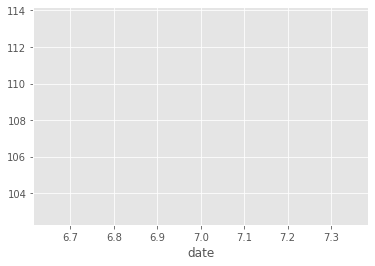

In [67]:
short_tweets_Ukr['text'].str.len().groupby(by=short_tweets_Ukr.index.month).mean().plot()

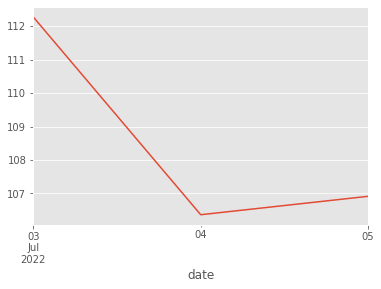

In [68]:
short_tweets_Ukr['text'].str.len().resample('D').mean().plot() 

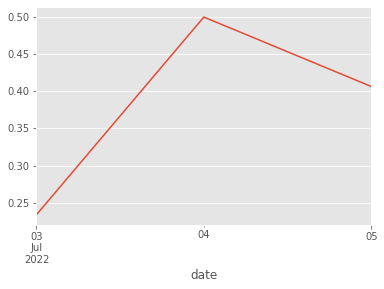

In [69]:
short_tweets_Ukr['positivity'].resample('D').mean().plot() 

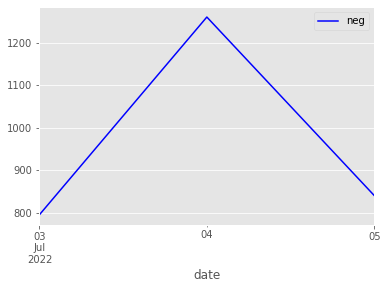

In [70]:
short_tweets_Ukr['negative'].resample('D').sum().plot(color = 'b',label = 'neg').legend() 

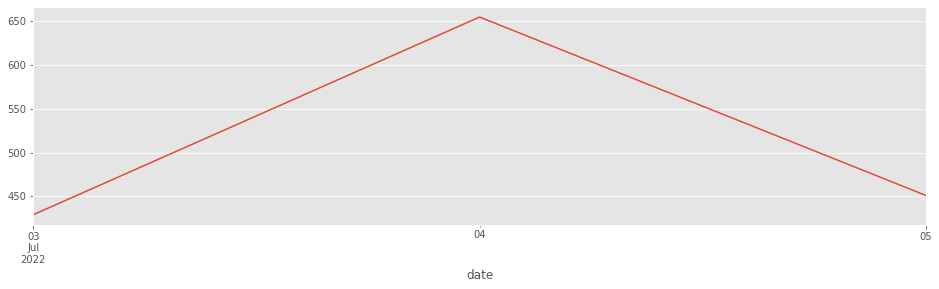

In [71]:
short_tweets_Ukr['anger'].resample('D').sum().plot(figsize=(16,4))

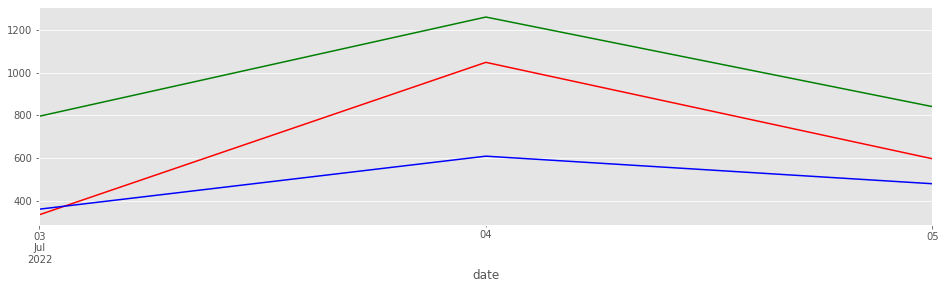

In [72]:
ax = short_tweets_Ukr['positivity'].resample('D').sum().plot(figsize=(16,4), color = 'red')
short_tweets_Ukr['negative'].resample('D').sum().plot(figsize=(16,4), ax = ax, color = 'green')
short_tweets_Ukr['trust'].resample('D').sum().plot(figsize=(16,4), ax = ax, color = 'blue')

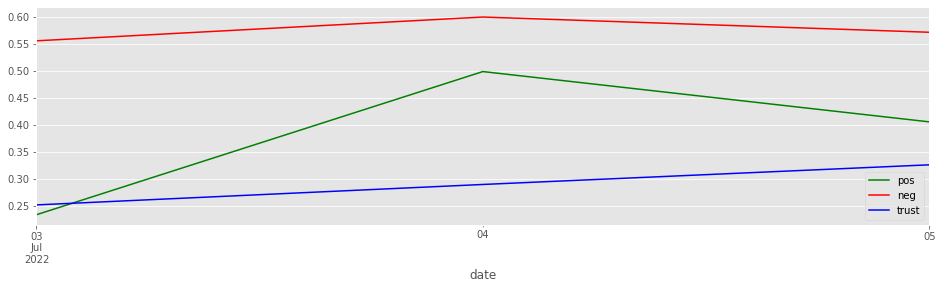

In [73]:
ax = short_tweets_Ukr['positivity'].resample('D').mean().plot(figsize=(16,4), 
                                                          color = 'g', label='pos')
short_tweets_Ukr['negative'].resample('D').mean().plot(figsize=(16,4), ax = ax, 
                                                   label = 'neg', color = 'r')
short_tweets_Ukr['trust'].resample('D').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'trust',color = 'blue').legend()

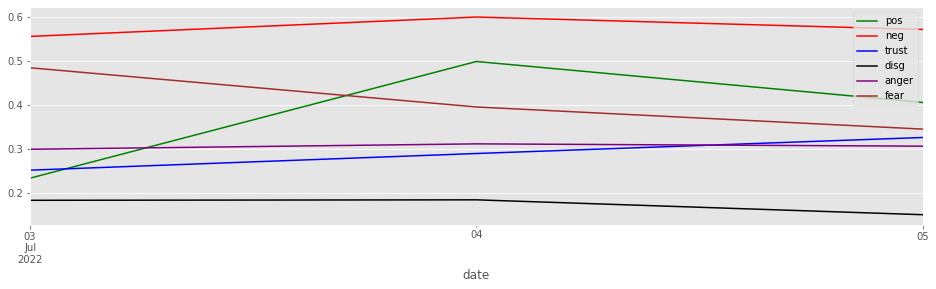

In [74]:
plt.style.use('ggplot')
ax = short_tweets_Ukr['positivity'].resample('D').mean().plot(figsize=(16,4), 
                                                          color = 'g', label='pos')
short_tweets_Ukr['negative'].resample('D').mean().plot(figsize=(16,4), ax = ax, 
                                                   label = 'neg', color = 'r')
short_tweets_Ukr['trust'].resample('D').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'trust',color = 'blue').legend()

short_tweets_Ukr['disgust'].resample('D').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'disg',color = 'black').legend() 

short_tweets_Ukr['anger'].resample('D').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'anger',color = 'purple').legend() 

short_tweets_Ukr['fear'].resample('D').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'fear',color = 'brown').legend()    

Text(0, 0.5, 'Hour of the day')

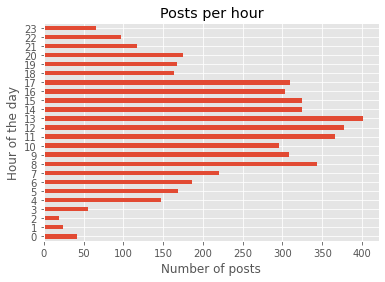

In [75]:
short_tweets_Ukr['text'].groupby(by=short_tweets_Ukr.index.hour).count().plot(kind='barh')
plt.title("Posts per hour")
plt.xlabel("Number of posts")
plt.ylabel("Hour of the day")

#  #Ρωσία

In [76]:
tweets = []
MAX_ATTEMPTS = 50
COUNT_OF_TWEETS_TO_BE_FETCHED = 10000 

for i in range(0,MAX_ATTEMPTS):

    if(COUNT_OF_TWEETS_TO_BE_FETCHED < len(tweets)):
        print("We Got ", len(tweets), " tweets!!!")
        break # we got the  tweets... !!

    #----------------------------------------------------------------#
    # STEP 1: Query Twitter
    # STEP 2: Save the returned tweets
    # STEP 3: Get the next max_id
    #----------------------------------------------------------------#

    # STEP 1: Query Twitter
    if(0 == i):
        # Query twitter for data. 
        results = twitter.search(q="Ρωσία",count='100')
        print("I Got:", len(results['statuses']), " tweets")
    else:
        # After the first call we should have max_id from result of previous call. Pass it in query.
        results = twitter.search(q="ρωσία",count='100', include_entities='true',max_id=next_max_id)
        print("I Got:", len(results['statuses']), " tweets")


    # STEP 2: Save the returned tweets
    for result in results['statuses']:
#        tweet_text = result['text']
        tweets.append(result)


    # STEP 3: Get the next max_id
    try:
        # Parse the data returned to get max_id to be passed in consequent call.
        next_results_url_params = results['search_metadata']['next_results']
        next_max_id = next_results_url_params.split('max_id=')[1].split('&')[0]
    except:
        # No more next pages
        break

I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets
I Got: 100  tweets


In [77]:
#results['search_metadata']

In [78]:
#results['statuses']

In [79]:
Ru_df = pd.DataFrame(tweets)
Ru_df

,created_at,id,id_str,text,truncated,entities,metadata,source,in_reply_to_status_id,in_reply_to_status_id_str,...,favorite_count,favorited,retweeted,possibly_sensitive,lang,retweeted_status,extended_entities,quoted_status_id,quoted_status_id_str,quoted_status
0,Tue Jul 05 17:50:23 +0000 2022,1544378168462680066,1544378168462680066,ΟΙ ΕΥΡΩΠΑΙΟΙ ΗΓΕΤΕΣ ΕΓΚΛΗΜΑΤΟΥΝ ΚΑΤΑ ΤΩΝ ΛΑΩΝ ...,True,"{'hashtags': [], 'symbols': [], 'user_mentions...","{'iso_language_code': 'el', 'result_type': 're...","<a href=""https://mobile.twitter.com"" rel=""nofo...",NaN,None,...,0,False,False,False,el,NaN,NaN,NaN,NaN,NaN
1,Tue Jul 05 17:48:59 +0000 2022,1544377816057249793,1544377816057249793,RT @ManGiannarakis: Ο Ερντογάν θα επισκεφθεί τ...,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","{'iso_language_code': 'el', 'result_type': 're...","<a href=""https://mobile.twitter.com"" rel=""nofo...",NaN,None,...,0,False,False,NaN,el,{'created_at': 'Tue Jul 05 11:15:01 +0000 2022...,NaN,NaN,NaN,NaN
2,Tue Jul 05 17:48:07 +0000 2022,1544377598725312512,1544377598725312512,@manosxatzid @BabeufGr @lathranagnosti1 @deli_...,True,"{'hashtags': [], 'symbols': [], 'user_mentions...","{'iso_language_code': 'el', 'result_type': 're...","<a href=""https://mobile.twitter.com"" rel=""nofo...",1.544377e+18,1544376964651384841,...,0,False,False,NaN,el,NaN,NaN,NaN,NaN,NaN
3,Tue Jul 05 17:46:25 +0000 2022,1544377173284474884,1544377173284474884,Γιώργος Ρωμανός: Η Ρωσία έτοιμη να πάρει το 40...,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","{'iso_language_code': 'el', 'result_type': 're...","<a href=""https://mobile.twitter.com"" rel=""nofo...",NaN,None,...,0,False,False,False,el,NaN,NaN,NaN,NaN,NaN
4,Tue Jul 05 17:44:14 +0000 2022,1544376623289491456,1544376623289491456,RT @euro2day_gr: Κλείνει η εβραϊκή υπηρεσία στ...,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","{'iso_language_code': 'el', 'result_type': 're...","<a href=""http://twitter.com/download/android"" ...",NaN,None,...,0,False,False,False,el,{'created_at': 'Tue Jul 05 17:33:16 +0000 2022...,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,Thu Jun 30 15:42:39 +0000 2022,1542534087189094400,1542534087189094400,RT @in_gr: Ρωσία: Μαχητές του τάγματος Αζόφ θα...,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","{'iso_language_code': 'el', 'result_type': 're...","<a href=""http://twitter.com/download/iphone"" r...",NaN,None,...,0,False,False,False,el,{'created_at': 'Thu Jun 30 15:29:19 +0000 2022...,NaN,NaN,NaN,NaN
4996,Thu Jun 30 15:40:53 +0000 2022,1542533642836185093,1542533642836185093,RT @entimos3: Η Γερμανία σε φούλ καύση λιγνίτη...,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","{'iso_language_code': 'el', 'result_type': 're...","<a href=""http://twitter.com/download/iphone"" r...",NaN,None,...,0,False,False,NaN,el,{'created_at': 'Thu Jun 30 12:35:20 +0000 2022...,NaN,NaN,NaN,NaN
4997,Thu Jun 30 15:40:02 +0000 2022,1542533425457991680,1542533425457991680,RT @NikosMichael6: Στη Ρωσία η Δούμα ψήφισε νό...,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","{'iso_language_code': 'el', 'result_type': 're...","<a href=""http://twitter.com/download/android"" ...",NaN,None,...,0,False,False,NaN,el,{'created_at': 'Thu Jun 30 15:37:21 +0000 2022...,NaN,NaN,NaN,NaN
4998,Thu Jun 30 15:39:02 +0000 2022,1542533177184362497,1542533177184362497,RT @VasilisXtM: Ο Μητσοτάκης να ικετεύει για ε...,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","{'iso_language_code': 'el', 'result_type': 're...","<a href=""http://twitter.com/download/android"" ...",NaN,None,...,0,False,False,NaN,el,{'created_at': 'Wed Jun 29 13:37:39 +0000 2022...,NaN,NaN,NaN,NaN


In [80]:
# Number of tweets the user has made
print("I got :", len(Ru_df), " in total!!!")

I got : 5000  in total!!!


In [81]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [82]:
Ru_df.to_csv("/content/gdrive/My Drive/Colab Notebooks/Ρωσία_tweet.tsv", sep='\t')

# Νέα ενότητα #Ρωσία

In [83]:
Ru_df =pd.read_csv("/content/gdrive/My Drive/Colab Notebooks/Ρωσία_tweet.tsv", sep='\t')

In [84]:
Ru = Ru_df[['created_at','text' ]]
Ru = Ru.rename(columns={'created_at': 'date'} )
Ru

,date,text
0,Tue Jul 05 17:50:23 +0000 2022,ΟΙ ΕΥΡΩΠΑΙΟΙ ΗΓΕΤΕΣ ΕΓΚΛΗΜΑΤΟΥΝ ΚΑΤΑ ΤΩΝ ΛΑΩΝ ...
1,Tue Jul 05 17:48:59 +0000 2022,RT @ManGiannarakis: Ο Ερντογάν θα επισκεφθεί τ...
2,Tue Jul 05 17:48:07 +0000 2022,@manosxatzid @BabeufGr @lathranagnosti1 @deli_...
3,Tue Jul 05 17:46:25 +0000 2022,Γιώργος Ρωμανός: Η Ρωσία έτοιμη να πάρει το 40...
4,Tue Jul 05 17:44:14 +0000 2022,RT @euro2day_gr: Κλείνει η εβραϊκή υπηρεσία στ...
...,...,...
4995,Thu Jun 30 15:42:39 +0000 2022,RT @in_gr: Ρωσία: Μαχητές του τάγματος Αζόφ θα...
4996,Thu Jun 30 15:40:53 +0000 2022,RT @entimos3: Η Γερμανία σε φούλ καύση λιγνίτη...
4997,Thu Jun 30 15:40:02 +0000 2022,RT @NikosMichael6: Στη Ρωσία η Δούμα ψήφισε νό...
4998,Thu Jun 30 15:39:02 +0000 2022,RT @VasilisXtM: Ο Μητσοτάκης να ικετεύει για ε...


In [85]:
#Ru.dtypes

In [86]:
Ru['year'] = pd.DatetimeIndex(Ru['date']).year
Ru['month'] = pd.DatetimeIndex(Ru['date']).month
Ru['day'] = pd.DatetimeIndex(Ru['date']).day
Ru

,date,text,year,month,day
0,Tue Jul 05 17:50:23 +0000 2022,ΟΙ ΕΥΡΩΠΑΙΟΙ ΗΓΕΤΕΣ ΕΓΚΛΗΜΑΤΟΥΝ ΚΑΤΑ ΤΩΝ ΛΑΩΝ ...,2022,7,5
1,Tue Jul 05 17:48:59 +0000 2022,RT @ManGiannarakis: Ο Ερντογάν θα επισκεφθεί τ...,2022,7,5
2,Tue Jul 05 17:48:07 +0000 2022,@manosxatzid @BabeufGr @lathranagnosti1 @deli_...,2022,7,5
3,Tue Jul 05 17:46:25 +0000 2022,Γιώργος Ρωμανός: Η Ρωσία έτοιμη να πάρει το 40...,2022,7,5
4,Tue Jul 05 17:44:14 +0000 2022,RT @euro2day_gr: Κλείνει η εβραϊκή υπηρεσία στ...,2022,7,5
...,...,...,...,...,...
4995,Thu Jun 30 15:42:39 +0000 2022,RT @in_gr: Ρωσία: Μαχητές του τάγματος Αζόφ θα...,2022,6,30
4996,Thu Jun 30 15:40:53 +0000 2022,RT @entimos3: Η Γερμανία σε φούλ καύση λιγνίτη...,2022,6,30
4997,Thu Jun 30 15:40:02 +0000 2022,RT @NikosMichael6: Στη Ρωσία η Δούμα ψήφισε νό...,2022,6,30
4998,Thu Jun 30 15:39:02 +0000 2022,RT @VasilisXtM: Ο Μητσοτάκης να ικετεύει για ε...,2022,6,30


In [87]:
Ru['text'] = Ru['text'].str.replace(r'https?:\/\/.*[\r\n]*'," ")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  """Entry point for launching an IPython kernel.


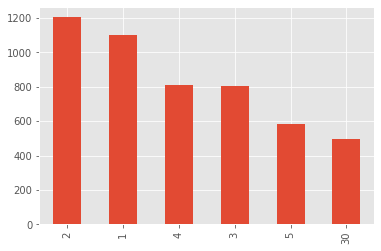

In [88]:
Ru['day'].value_counts().plot(kind='bar')

In [89]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

In [90]:
Ru[Ru['year']==2022]['text']

0       ΟΙ ΕΥΡΩΠΑΙΟΙ ΗΓΕΤΕΣ ΕΓΚΛΗΜΑΤΟΥΝ ΚΑΤΑ ΤΩΝ ΛΑΩΝ ...
1       RT @ManGiannarakis: Ο Ερντογάν θα επισκεφθεί τ...
2       @manosxatzid @BabeufGr @lathranagnosti1 @deli_...
3       Γιώργος Ρωμανός: Η Ρωσία έτοιμη να πάρει το 40...
4       RT @euro2day_gr: Κλείνει η εβραϊκή υπηρεσία στ...
                              ...                        
4995    RT @in_gr: Ρωσία: Μαχητές του τάγματος Αζόφ θα...
4996    RT @entimos3: Η Γερμανία σε φούλ καύση λιγνίτη...
4997    RT @NikosMichael6: Στη Ρωσία η Δούμα ψήφισε νό...
4998    RT @VasilisXtM: Ο Μητσοτάκης να ικετεύει για ε...
4999    RT @libre_gr: Πούτιν: Η Ρωσία θα απαντήσει αν ...
Name: text, Length: 5000, dtype: object

In [91]:
# Ισως καποτε χρειαστεί να αφαιρέσουμε τους τόνους.....
text = Ru['text'].str.replace('ά','α').str.replace("έ", "ε").str.replace('ή','η').str.replace('ί','ι').str.replace('ό','ο').str.replace('ύ','υ').str.replace('ώ','ω')

In [92]:
text = Ru[Ru['year']==2022]['text'].str.cat(sep = '.').replace("amp", ' ')
text

'ΟΙ ΕΥΡΩΠΑΙΟΙ ΗΓΕΤΕΣ ΕΓΚΛΗΜΑΤΟΥΝ ΚΑΤΑ ΤΩΝ ΛΑΩΝ ΤΟΥΣ: ΑΝΤΙ ΝΑ ΠΙΕΣΟΥΝ ΤΟΝ ΖΕΛΕΝΣΚΥ ΝΑ ΣΥΝΘΗΚΟΛΟΓΗΣΕΙ,ΤΟΥ ΣΤΕΛΝΟΥΝ ΟΠΛ…  .RT @ManGiannarakis: Ο Ερντογάν θα επισκεφθεί το Ιράν στις 19 Ιουλίου\n\nΤουρκία - Ρωσία - Ιράν - Κίνα\n\nΟ άξονας του κακού, οι εχθροί της Αμερ….@manosxatzid @BabeufGr @lathranagnosti1 @deli_despina @ivansalonik Ξαναφτιαξτε μετα τη νικη σας το επομενο ΝΑΤΟ, να…  .Γιώργος Ρωμανός: Η Ρωσία έτοιμη να πάρει το 40% εδαφών Ουκρανίας. Χάρτες...  .RT @euro2day_gr: Κλείνει η εβραϊκή υπηρεσία στη Ρωσία, απειλείται κρίση Μόσχας-Τελ Αβίβ  .@basketfellas Ο Νικ μπορούσε να εγγυηθεί την 8αδα τότε. Ακόμα και χωρίς της ομάδες από Ρωσία, δεν βλέπω πώς το Νικ-…  .RT @KYTKYTKYTKYTKYT: Ο Πρόεδρος Πούτιν εξηγεί γιατί η Ρωσία μπορεί να ανεχθεί τη Φινλανδία και τη Σουηδία στο ΝΑΤΟ, αλλά όχι την Ουκρανία.….@uniformedprole @deli_despina @AQualekos @PRKarea Λοιπόν έχω γαμάτη ιδέα: Επειδή η Ρωσία είναι καπιταλιστική και ο…  .ΗΤΑΝ ΕΠΙΣΗΣ ΤΕΡΑΣΤΙΟΣ ΛΑΘΟΣ ΧΕΙΡΣΙΜΟΣ ΤΟΥ ΖΕΛΕΝΣΚΙ ΟΤΑΝ ΕΒΛΕΠΕ ΣΤΑ ΣΥΝΟ

In [93]:
list(STOPWORDS)[0:20]

['me',
 "shouldn't",
 "you're",
 "he'll",
 'themselves',
 'our',
 'over',
 'same',
 'when',
 "it's",
 'having',
 'how',
 'who',
 'out',
 'was',
 'few',
 'myself',
 'he',
 'very',
 'could']

In [94]:
import spacy
!python -m spacy download el_core_news_sm

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached https://github.com/explosion/spacy-models/releases/download/el_core_news_sm-3.3.0/el_core_news_sm-3.3.0-py3-none-any.whl (12.6 MB)
✔ Download and installation successful
You can now load the package via spacy.load('el_core_news_sm')


In [95]:
nlp = spacy.load('el_core_news_sm')
list(nlp.Defaults.stop_words)[0:20]

['αναμεταξύ',
 'πρόπερσι',
 'την',
 'άλλη',
 'ήδη',
 'όλους',
 'δεξιά',
 'παρά',
 'πρώτες',
 'ετούτες',
 'καθένας',
 'τώρα',
 'εν',
 'τέτοιας',
 'μιαν',
 'εφεξής',
 'τέτοιο',
 'προχθές',
 'τους',
 'ήτανε']

In [96]:
text = Ru['text'].str.cat(sep = '.').replace('.','').strip()
text = text.replace('amp','').strip()
text = text.replace('rt','').strip()
text = text.replace('\n','').strip()
text = text.replace(':','').strip()
text

'ΟΙ ΕΥΡΩΠΑΙΟΙ ΗΓΕΤΕΣ ΕΓΚΛΗΜΑΤΟΥΝ ΚΑΤΑ ΤΩΝ ΛΑΩΝ ΤΟΥΣ ΑΝΤΙ ΝΑ ΠΙΕΣΟΥΝ ΤΟΝ ΖΕΛΕΝΣΚΥ ΝΑ ΣΥΝΘΗΚΟΛΟΓΗΣΕΙ,ΤΟΥ ΣΤΕΛΝΟΥΝ ΟΠΛ…  RT @ManGiannarakis Ο Ερντογάν θα επισκεφθεί το Ιράν στις 19 ΙουλίουΤουρκία - Ρωσία - Ιράν - ΚίναΟ άξονας του κακού, οι εχθροί της Αμερ…@manosxatzid @BabeufGr @lathranagnosti1 @deli_despina @ivansalonik Ξαναφτιαξτε μετα τη νικη σας το επομενο ΝΑΤΟ, να…  Γιώργος Ρωμανός Η Ρωσία έτοιμη να πάρει το 40% εδαφών Ουκρανίας Χάρτες  RT @euro2day_gr Κλείνει η εβραϊκή υπηρεσία στη Ρωσία, απειλείται κρίση Μόσχας-Τελ Αβίβ  @basketfellas Ο Νικ μπορούσε να εγγυηθεί την 8αδα τότε Ακόμα και χωρίς της ομάδες από Ρωσία, δεν βλέπω πώς το Νικ-…  RT @KYTKYTKYTKYTKYT Ο Πρόεδρος Πούτιν εξηγεί γιατί η Ρωσία μπορεί να ανεχθεί τη Φινλανδία και τη Σουηδία στο ΝΑΤΟ, αλλά όχι την Ουκρανία…@uniformedprole @deli_despina @AQualekos @PRKarea Λοιπόν έχω γαμάτη ιδέα Επειδή η Ρωσία είναι καπιταλιστική και ο…  ΗΤΑΝ ΕΠΙΣΗΣ ΤΕΡΑΣΤΙΟΣ ΛΑΘΟΣ ΧΕΙΡΣΙΜΟΣ ΤΟΥ ΖΕΛΕΝΣΚΙ ΟΤΑΝ ΕΒΛΕΠΕ ΣΤΑ ΣΥΝΟΡΑ ΤΟΥ 180000 ΣΤΡΑΤΟ ΚΑΙ ΕΛΕ

In [97]:
from PIL import Image
import numpy as np

In [98]:
doc = nlp(Ru['text'][1])

In [99]:
for token in doc:
    print(token, token.lemma_)

RT RT
@ManGiannarakis @ManGiannarakis
: :
Ο ο
Ερντογάν ερντογάν
θα θα
επισκεφθεί επισκεφθεί
το ο
Ιράν Ιράν
στις σε ο
19 19
Ιουλίου Ιουλίου


 


Τουρκία Τουρκία
- -
Ρωσία Ρωσία
- -
Ιράν Ιράν
- -
Κίνα Κίνα


 


Ο ο
άξονας άξονα
του ο
κακού κακός
, ,
οι ο
εχθροί εχθρός
της ο
Αμερ Αμερ
… …


In [100]:
' '.join(token.lemma_ for token in doc)
text

'ΟΙ ΕΥΡΩΠΑΙΟΙ ΗΓΕΤΕΣ ΕΓΚΛΗΜΑΤΟΥΝ ΚΑΤΑ ΤΩΝ ΛΑΩΝ ΤΟΥΣ ΑΝΤΙ ΝΑ ΠΙΕΣΟΥΝ ΤΟΝ ΖΕΛΕΝΣΚΥ ΝΑ ΣΥΝΘΗΚΟΛΟΓΗΣΕΙ,ΤΟΥ ΣΤΕΛΝΟΥΝ ΟΠΛ…  RT @ManGiannarakis Ο Ερντογάν θα επισκεφθεί το Ιράν στις 19 ΙουλίουΤουρκία - Ρωσία - Ιράν - ΚίναΟ άξονας του κακού, οι εχθροί της Αμερ…@manosxatzid @BabeufGr @lathranagnosti1 @deli_despina @ivansalonik Ξαναφτιαξτε μετα τη νικη σας το επομενο ΝΑΤΟ, να…  Γιώργος Ρωμανός Η Ρωσία έτοιμη να πάρει το 40% εδαφών Ουκρανίας Χάρτες  RT @euro2day_gr Κλείνει η εβραϊκή υπηρεσία στη Ρωσία, απειλείται κρίση Μόσχας-Τελ Αβίβ  @basketfellas Ο Νικ μπορούσε να εγγυηθεί την 8αδα τότε Ακόμα και χωρίς της ομάδες από Ρωσία, δεν βλέπω πώς το Νικ-…  RT @KYTKYTKYTKYTKYT Ο Πρόεδρος Πούτιν εξηγεί γιατί η Ρωσία μπορεί να ανεχθεί τη Φινλανδία και τη Σουηδία στο ΝΑΤΟ, αλλά όχι την Ουκρανία…@uniformedprole @deli_despina @AQualekos @PRKarea Λοιπόν έχω γαμάτη ιδέα Επειδή η Ρωσία είναι καπιταλιστική και ο…  ΗΤΑΝ ΕΠΙΣΗΣ ΤΕΡΑΣΤΙΟΣ ΛΑΘΟΣ ΧΕΙΡΣΙΜΟΣ ΤΟΥ ΖΕΛΕΝΣΚΙ ΟΤΑΝ ΕΒΛΕΠΕ ΣΤΑ ΣΥΝΟΡΑ ΤΟΥ 180000 ΣΤΡΑΤΟ ΚΑΙ ΕΛΕ

In [101]:
full_doc = nlp(text)

In [102]:
clear_text = ' '.join(token.lemma_ for token in full_doc)
clear_text[200:400]

'ία - Ιράν - ΚίναΟ άξονα ο κακός , ο εχθρός ο αμερ … @manosxatzid @BabeufGr @lathranagnosti1 @deli_despina @ivansalonik Ξαναφτιαξτε μετα ο νικη μου ο επομενος ΝΑΤΟ , να …   γιώργος Ρωμανός ο Ρωσία έτοι'

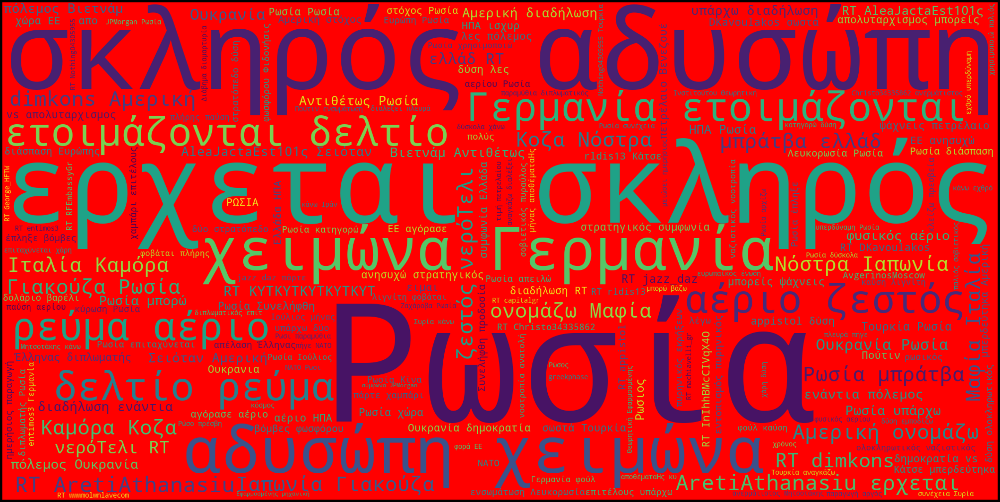

In [103]:
wordcloud = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    width = 2000,
    height = 1000,
    background_color = 'red'
 ).generate(clear_text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [104]:
from collections import Counter
Counter(" ".join(Ru["text"]).split()).most_common(16)

[('RT', 2315),
 ('Ρωσία', 2107),
 ('και', 2106),
 ('στην', 1803),
 ('την', 1687),
 ('η', 1303),
 ('για', 1182),
 ('να', 1132),
 ('Η', 1130),
 ('το', 1112),
 ('της', 1085),
 ('με', 1045),
 ('τη', 859),
 ('από', 857),
 ('του', 747),
 ('σε', 699)]

In [105]:
for word in nlp.Defaults.stop_words:
  print(word)
  break

αναμεταξύ


In [106]:
Ru['text_no_stopwords'] = Ru['text'].apply(lambda x: ' '.join([word for word in x.split() if word not in (nlp.Defaults.stop_words) and word != ':' and word != '\n' and word != "amp" and word != 'rt' and word != ',']))
Ru['text_no_stopwords'] = Ru['text'].apply(lambda x: ' '.join([word for word in x.split() if word not in (nlp.Defaults.stop_words)]))
Ru['clean_text_no_stopwords'] = Ru['text']
#for stopword in nlp.Defaults.stop_words:
Ru['clean_text_no_stopwords'] = Ru['clean_text_no_stopwords'].apply(lambda x: ' '.join([word for word in x.split() if word not in nlp.Defaults.stop_words and word != "ή" and word != "ία" and word != "κι"]))
Ru['clean_text_no_stopwords'] = Ru['clean_text_no_stopwords'].apply(lambda x: x.replace("amp", "").strip())
Ru['clean_text_no_stopwords'] = Ru['clean_text_no_stopwords'].apply(lambda x: x.replace("rt", "").strip())
Ru['clean_text_no_stopwords'] = Ru['clean_text_no_stopwords'].apply(lambda x: x.replace(":", "").strip())
Ru['clean_text_no_stopwords'] = Ru['clean_text_no_stopwords'].apply(lambda x: x.replace(",", "").strip())
Ru['clean_text_no_stopwords'] = Ru['clean_text_no_stopwords'].apply(lambda x: x.replace("\n", "").strip())
Ru['clean_text_no_stopwords'] = Ru['clean_text_no_stopwords'].apply(lambda x: x.replace(".", "").strip())

In [107]:
freq = Counter(" ".join(Ru["clean_text_no_stopwords"]).split()).most_common(16)
freq

[('Ρωσία', 2712),
 ('RT', 2318),
 ('Η', 1130),
 ('Στην', 558),
 ('Ουκρανία', 420),
 ('Αμερική', 391),
 ('αέριο', 383),
 ('-', 372),
 ('Γερμανία', 338),
 ('Ο', 291),
 ('@AretiAthanasiu', 286),
 ('ρεύμα', 282),
 ('ετοιμάζονται', 279),
 ('ζεστό', 279),
 ('χειμώνας', 278),
 ('δελτίο', 278)]

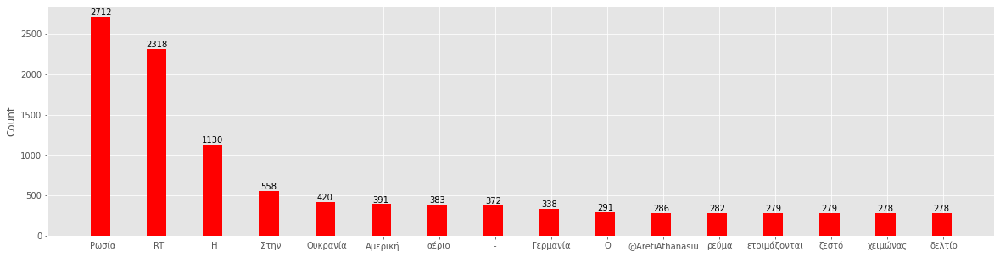

In [108]:
names, values = zip(*freq)
# names = [x[0] for x in data]  # These two lines are equivalent to the the zip-command.
# values = [x[1] for x in data] # These two lines are equivalent to the the zip-command.

ind = np.arange(len(freq))  # the x locations for the groups
width = 0.35       # the width of the bars

fig, ax = plt.subplots(figsize=(20,5))
rects1 = ax.bar(ind, values, width, color='r')
# add some text for labels, title and axes ticks
ax.set_ylabel('Count')
ax.set_xticks(ind+width/10.)
ax.set_xticklabels(names)

def autolabel(rects):
    # attach some text labels
    for rect in rects:
        height = rect.get_height()
        ax.text(rect.get_x() + rect.get_width()/2, height,
                '%d' % int(height),
                ha='center', va='bottom')

autolabel(rects1)

plt.show()

# Emolex Ρωσία

In [109]:
filepath = "https://raw.githubusercontent.com/datajour-gr/Data_journalism/master/week10/NRC_GREEK_Translated_6_2020.csv"
emolex_df = pd.read_csv(filepath)
emolex_df.head()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
0,αφεση,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,ενορκη βεβαιωση,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,εχοντας,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,εχω,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,οριο,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [110]:
emolex_df.tail()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
13166,ουρλιασμα,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
13167,κροκος αυγου,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13168,νεοτερος,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13169,ζεφυρος,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13170,ζουμ,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [111]:
emolex_df = emolex_df.drop_duplicates(subset=['word'])
emolex_df = emolex_df.dropna()
emolex_df.reset_index(drop = True, inplace = True)

In [112]:
emolex_df.tail()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
13156,ουρλιασμα,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
13157,κροκος αυγου,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13158,νεοτερος,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13159,ζεφυρος,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13160,ζουμ,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [113]:
import spacy
nlp = spacy.load('el_core_news_sm')

In [114]:
len(Ru)
Ru

,date,text,year,month,day,text_no_stopwords,clean_text_no_stopwords
0,Tue Jul 05 17:50:23 +0000 2022,ΟΙ ΕΥΡΩΠΑΙΟΙ ΗΓΕΤΕΣ ΕΓΚΛΗΜΑΤΟΥΝ ΚΑΤΑ ΤΩΝ ΛΑΩΝ ...,2022,7,5,ΟΙ ΕΥΡΩΠΑΙΟΙ ΗΓΕΤΕΣ ΕΓΚΛΗΜΑΤΟΥΝ ΚΑΤΑ ΤΩΝ ΛΑΩΝ ...,ΟΙ ΕΥΡΩΠΑΙΟΙ ΗΓΕΤΕΣ ΕΓΚΛΗΜΑΤΟΥΝ ΚΑΤΑ ΤΩΝ ΛΑΩΝ ...
1,Tue Jul 05 17:48:59 +0000 2022,RT @ManGiannarakis: Ο Ερντογάν θα επισκεφθεί τ...,2022,7,5,RT @ManGiannarakis: Ο Ερντογάν επισκεφθεί Ιράν...,RT @ManGiannarakis Ο Ερντογάν επισκεφθεί Ιράν ...
2,Tue Jul 05 17:48:07 +0000 2022,@manosxatzid @BabeufGr @lathranagnosti1 @deli_...,2022,7,5,@manosxatzid @BabeufGr @lathranagnosti1 @deli_...,@manosxatzid @BabeufGr @lathranagnosti1 @deli_...
3,Tue Jul 05 17:46:25 +0000 2022,Γιώργος Ρωμανός: Η Ρωσία έτοιμη να πάρει το 40...,2022,7,5,Γιώργος Ρωμανός: Η Ρωσία έτοιμη πάρει 40% εδαφ...,Γιώργος Ρωμανός Η Ρωσία έτοιμη πάρει 40% εδαφώ...
4,Tue Jul 05 17:44:14 +0000 2022,RT @euro2day_gr: Κλείνει η εβραϊκή υπηρεσία στ...,2022,7,5,RT @euro2day_gr: Κλείνει εβραϊκή υπηρεσία Ρωσί...,RT @euro2day_gr Κλείνει εβραϊκή υπηρεσία Ρωσία...
...,...,...,...,...,...,...,...
4995,Thu Jun 30 15:42:39 +0000 2022,RT @in_gr: Ρωσία: Μαχητές του τάγματος Αζόφ θα...,2022,6,30,RT @in_gr: Ρωσία: Μαχητές τάγματος Αζόφ προσαχ...,RT @in_gr Ρωσία Μαχητές τάγματος Αζόφ προσαχθο...
4996,Thu Jun 30 15:40:53 +0000 2022,RT @entimos3: Η Γερμανία σε φούλ καύση λιγνίτη...,2022,6,30,RT @entimos3: Η Γερμανία φούλ καύση λιγνίτη φο...,RT @entimos3 Η Γερμανία φούλ καύση λιγνίτη φοβ...
4997,Thu Jun 30 15:40:02 +0000 2022,RT @NikosMichael6: Στη Ρωσία η Δούμα ψήφισε νό...,2022,6,30,RT @NikosMichael6: Στη Ρωσία Δούμα ψήφισε νόμο...,RT @NikosMichael6 Στη Ρωσία Δούμα ψήφισε νόμο ...
4998,Thu Jun 30 15:39:02 +0000 2022,RT @VasilisXtM: Ο Μητσοτάκης να ικετεύει για ε...,2022,6,30,RT @VasilisXtM: Ο Μητσοτάκης ικετεύει είσοδο Β...,RT @VasilisXtM Ο Μητσοτάκης ικετεύει είσοδο Β ...


In [115]:
short_tweets_Ru = Ru[['date','text' ]]

short_tweets_Ru

,date,text
0,Tue Jul 05 17:50:23 +0000 2022,ΟΙ ΕΥΡΩΠΑΙΟΙ ΗΓΕΤΕΣ ΕΓΚΛΗΜΑΤΟΥΝ ΚΑΤΑ ΤΩΝ ΛΑΩΝ ...
1,Tue Jul 05 17:48:59 +0000 2022,RT @ManGiannarakis: Ο Ερντογάν θα επισκεφθεί τ...
2,Tue Jul 05 17:48:07 +0000 2022,@manosxatzid @BabeufGr @lathranagnosti1 @deli_...
3,Tue Jul 05 17:46:25 +0000 2022,Γιώργος Ρωμανός: Η Ρωσία έτοιμη να πάρει το 40...
4,Tue Jul 05 17:44:14 +0000 2022,RT @euro2day_gr: Κλείνει η εβραϊκή υπηρεσία στ...
...,...,...
4995,Thu Jun 30 15:42:39 +0000 2022,RT @in_gr: Ρωσία: Μαχητές του τάγματος Αζόφ θα...
4996,Thu Jun 30 15:40:53 +0000 2022,RT @entimos3: Η Γερμανία σε φούλ καύση λιγνίτη...
4997,Thu Jun 30 15:40:02 +0000 2022,RT @NikosMichael6: Στη Ρωσία η Δούμα ψήφισε νό...
4998,Thu Jun 30 15:39:02 +0000 2022,RT @VasilisXtM: Ο Μητσοτάκης να ικετεύει για ε...


In [116]:
short_tweets_Ru.tail()

,date,text
4995,Thu Jun 30 15:42:39 +0000 2022,RT @in_gr: Ρωσία: Μαχητές του τάγματος Αζόφ θα...
4996,Thu Jun 30 15:40:53 +0000 2022,RT @entimos3: Η Γερμανία σε φούλ καύση λιγνίτη...
4997,Thu Jun 30 15:40:02 +0000 2022,RT @NikosMichael6: Στη Ρωσία η Δούμα ψήφισε νό...
4998,Thu Jun 30 15:39:02 +0000 2022,RT @VasilisXtM: Ο Μητσοτάκης να ικετεύει για ε...
4999,Thu Jun 30 15:38:50 +0000 2022,RT @libre_gr: Πούτιν: Η Ρωσία θα απαντήσει αν ...


In [117]:
short_tweets_Ru.dtypes

date    object
text    object
dtype: object

In [118]:
short_tweets_Ru['date'] = pd.to_datetime(short_tweets_Ru['date'], format='%a %b %d %H:%M:%S +0000 %Y')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [119]:
short_tweets_Ru['year'] = pd.DatetimeIndex(short_tweets_Ru['date']).year
short_tweets_Ru['month'] = pd.DatetimeIndex(short_tweets_Ru['date']).month
short_tweets_Ru['day'] = pd.DatetimeIndex(short_tweets_Ru['date']).day
short_tweets_Ru

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

,date,text,year,month,day
0,2022-07-05 17:50:23,ΟΙ ΕΥΡΩΠΑΙΟΙ ΗΓΕΤΕΣ ΕΓΚΛΗΜΑΤΟΥΝ ΚΑΤΑ ΤΩΝ ΛΑΩΝ ...,2022,7,5
1,2022-07-05 17:48:59,RT @ManGiannarakis: Ο Ερντογάν θα επισκεφθεί τ...,2022,7,5
2,2022-07-05 17:48:07,@manosxatzid @BabeufGr @lathranagnosti1 @deli_...,2022,7,5
3,2022-07-05 17:46:25,Γιώργος Ρωμανός: Η Ρωσία έτοιμη να πάρει το 40...,2022,7,5
4,2022-07-05 17:44:14,RT @euro2day_gr: Κλείνει η εβραϊκή υπηρεσία στ...,2022,7,5
...,...,...,...,...,...
4995,2022-06-30 15:42:39,RT @in_gr: Ρωσία: Μαχητές του τάγματος Αζόφ θα...,2022,6,30
4996,2022-06-30 15:40:53,RT @entimos3: Η Γερμανία σε φούλ καύση λιγνίτη...,2022,6,30
4997,2022-06-30 15:40:02,RT @NikosMichael6: Στη Ρωσία η Δούμα ψήφισε νό...,2022,6,30
4998,2022-06-30 15:39:02,RT @VasilisXtM: Ο Μητσοτάκης να ικετεύει για ε...,2022,6,30


In [120]:
short_tweets_Ru.dtypes

date     datetime64[ns]
text             object
year              int64
month             int64
day               int64
dtype: object

In [121]:
emolex_df['word'].head(3)

0              αφεση
1    ενορκη βεβαιωση
2            εχοντας
Name: word, dtype: object

In [122]:
short_tweets_Ru['text'] = short_tweets_Ru['text'].str.replace(r'https?:\/\/.*[\r\n]*'," ")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [123]:
short_tweets_Ru.head()

,date,text,year,month,day
0,2022-07-05 17:50:23,ΟΙ ΕΥΡΩΠΑΙΟΙ ΗΓΕΤΕΣ ΕΓΚΛΗΜΑΤΟΥΝ ΚΑΤΑ ΤΩΝ ΛΑΩΝ ...,2022,7,5
1,2022-07-05 17:48:59,RT @ManGiannarakis: Ο Ερντογάν θα επισκεφθεί τ...,2022,7,5
2,2022-07-05 17:48:07,@manosxatzid @BabeufGr @lathranagnosti1 @deli_...,2022,7,5
3,2022-07-05 17:46:25,Γιώργος Ρωμανός: Η Ρωσία έτοιμη να πάρει το 40...,2022,7,5
4,2022-07-05 17:44:14,RT @euro2day_gr: Κλείνει η εβραϊκή υπηρεσία στ...,2022,7,5


In [124]:
vec = CountVectorizer(analyzer = 'word', vocabulary = emolex_df.word, 
                      strip_accents = 'unicode',  
                      stop_words= nlp.Defaults.stop_words,
                      ngram_range=(1, 2))

In [125]:
#from sklearn.feature_extraction.text import TfidfVectorizer
#CountVectorizer(stop_words='english', binary=True)
# Θέλω να ελέγξω μόνο τις λέξεις που υπάρχουν στο συναισθηματικό λεξικό

#CountVectorizer(analyzer = 'word', 
#              strip_accents = 'unicode', 
#               token_pattern='[Α-Ωα-ωΆ-Ώά-ώ]{2,}', 
#               stop_words= lc_stop_words_df['stop_w'].tolist())


matrix = vec.fit_transform(short_tweets_Ru['text'])
vocab = vec.get_feature_names()
wordcount_df = pd.DataFrame(matrix.toarray(), columns=vocab)
wordcount_df.head()

/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:1323: UserWarning: Upper case characters found in vocabulary while 'lowercase' is True. These entries will not be matched with any documents
  "Upper case characters found in"
/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:401: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['αδιακοπα', 'ακομα', 'ακομη', 'ακριβως', 'αλλα', 'αλλαχου', 'αλλες', 'αλλη', 'αλλην', 'αλλης', 'αλλιως', 'αλλιωτικα', 'αλλο', 'αλλοι', 'αλλοιως', 'αλλοιωτικα', 'αλλον', 'αλλος', 'αλλοτε', 'αλλου', 'αλλους', 'αλλων', 'αμα', 'αμεσα', 'αμεσως', 'ανα', 'αναμεσα', 'αναμεταξυ', 'ανευ', 'αντι', 'αντιπερα', 'αντις', 'ανω', 'ανωτερω', 'αξαφνα', 'απεναντι', 'απο', 'αποψε', 'αρα', 'αραγε', 'αρκετα', 'αρκετες', 'αρχικα', 'αυριο', 'αυτα', 'αυτες', 'αυτη', 'αυτην', 'αυτης', 'αυτο', 'αυτοι', 'αυτον', 'αυτος', 'αυτου', 'αυτους', 'αυτων', 'αφοτου', 'αφου', 'βεβαια

,αφεση,ενορκη βεβαιωση,εχοντας,εχω,οριο,ορμος,υδρα,αγια τραπεζα,αμην,απατσι,...,κλητηριο ενταλμα,κατειργασμενος,μαγια,κιτρινο,κιτρινιζω,ουρλιασμα,κροκος αυγου,νεοτερος,ζεφυρος,ζουμ
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [126]:
wordcount_df.shape

(5000, 13161)

In [127]:
emolex_df.head()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
0,αφεση,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,ενορκη βεβαιωση,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,εχοντας,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,εχω,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,οριο,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [128]:
emolex_df[emolex_df.Anger == 1].tail()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
13094,διεξοδος,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13096,ζωυφια,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
13100,θυματοποιω,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0
13128,αποτυχημενος,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
13156,ουρλιασμα,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [129]:
# Φτιάξε μια λίστα με positive words

angry_words = emolex_df[emolex_df.Anger == 1]['word']

positive_words = emolex_df[emolex_df.Positive == 1]['word']


# Φτιάξε μια λίστα με sadness words
sadness_words = emolex_df[emolex_df.Sadness == 1]['word']


# Φτιάξε μια λίστα με surprise words
surprise_words = emolex_df[emolex_df.Surprise == 1]['word']


# Φτιάξε μια λίστα με disgust words
disgust_words = emolex_df[emolex_df.Disgust == 1]['word']


# Φτιάξε μια λίστα με anticipation words
anticipation_words = emolex_df[emolex_df.Anticipation == 1]['word']


# Φτιάξε μια λίστα με negative words
negative_words = emolex_df[emolex_df.Negative == 1]['word']



# Φτιάξε μια λίστα με joy words
joy_words = emolex_df[emolex_df.Joy == 1]['word']


# Φτιάξε μια λίστα με trust words
trust_words = emolex_df[emolex_df.Trust == 1]['word']



# Φτιάξε μια λίστα με fear words
fear_words = emolex_df[emolex_df.Fear == 1]['word']


In [130]:
short_tweets_Ru.head(3)

,date,text,year,month,day
0,2022-07-05 17:50:23,ΟΙ ΕΥΡΩΠΑΙΟΙ ΗΓΕΤΕΣ ΕΓΚΛΗΜΑΤΟΥΝ ΚΑΤΑ ΤΩΝ ΛΑΩΝ ...,2022,7,5
1,2022-07-05 17:48:59,RT @ManGiannarakis: Ο Ερντογάν θα επισκεφθεί τ...,2022,7,5
2,2022-07-05 17:48:07,@manosxatzid @BabeufGr @lathranagnosti1 @deli_...,2022,7,5


In [131]:
short_tweets_Ru['anger'] = wordcount_df[angry_words].sum(axis=1)

short_tweets_Ru['positivity'] = wordcount_df[positive_words].sum(axis=1)


short_tweets_Ru['joy'] = wordcount_df[joy_words].sum(axis=1)


short_tweets_Ru['disgust'] = wordcount_df[disgust_words].sum(axis=1)


short_tweets_Ru['surprise'] = wordcount_df[surprise_words].sum(axis=1)

short_tweets_Ru['trust'] = wordcount_df[trust_words].sum(axis=1)


short_tweets_Ru['anticipation'] = wordcount_df[anticipation_words].sum(axis=1)


short_tweets_Ru['sadness'] = wordcount_df[sadness_words].sum(axis=1)

short_tweets_Ru['negative'] = wordcount_df[negative_words].sum(axis=1)

short_tweets_Ru['fear'] = wordcount_df[fear_words].sum(axis=1)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [132]:
short_tweets_Ru

,date,text,year,month,day,anger,positivity,joy,disgust,surprise,trust,anticipation,sadness,negative,fear
0,2022-07-05 17:50:23,ΟΙ ΕΥΡΩΠΑΙΟΙ ΗΓΕΤΕΣ ΕΓΚΛΗΜΑΤΟΥΝ ΚΑΤΑ ΤΩΝ ΛΑΩΝ ...,2022,7,5,0,0,0,0,0,0,0,0,0,0
1,2022-07-05 17:48:59,RT @ManGiannarakis: Ο Ερντογάν θα επισκεφθεί τ...,2022,7,5,0,0,0,0,0,0,0,0,0,0
2,2022-07-05 17:48:07,@manosxatzid @BabeufGr @lathranagnosti1 @deli_...,2022,7,5,0,1,1,0,0,1,1,0,0,0
3,2022-07-05 17:46:25,Γιώργος Ρωμανός: Η Ρωσία έτοιμη να πάρει το 40...,2022,7,5,0,0,0,0,0,0,0,0,0,0
4,2022-07-05 17:44:14,RT @euro2day_gr: Κλείνει η εβραϊκή υπηρεσία στ...,2022,7,5,0,0,0,0,1,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2022-06-30 15:42:39,RT @in_gr: Ρωσία: Μαχητές του τάγματος Αζόφ θα...,2022,6,30,0,1,0,0,0,1,0,0,1,0
4996,2022-06-30 15:40:53,RT @entimos3: Η Γερμανία σε φούλ καύση λιγνίτη...,2022,6,30,0,0,0,0,0,0,0,0,2,0
4997,2022-06-30 15:40:02,RT @NikosMichael6: Στη Ρωσία η Δούμα ψήφισε νό...,2022,6,30,1,2,1,1,1,1,1,2,2,1
4998,2022-06-30 15:39:02,RT @VasilisXtM: Ο Μητσοτάκης να ικετεύει για ε...,2022,6,30,0,0,0,1,0,0,0,0,0,0


In [133]:
max = 0
happiest_tweet = ""
for i in range(0,len(short_tweets_Ru)):
  #print(short_tweets_Ru.iloc[i]['positivity'])
  if short_tweets_Ru.iloc[i]['positivity'] > max:
    happiest_tweet = short_tweets_Ru.iloc[i]['text']
    max = short_tweets_Ru.iloc[i]['positivity']


happiest_tweet

'RT @gyftaki_Kriti: Χάρη στον ηλίθιο Κούλη, δεν υπάρχει καμία περίπτωση να έρθει βοήθεια από τη Ρωσία όπως πέρυσι.  #φωτια'

In [134]:
max = 0
negative_tweet = ""
for i in range(0,len(short_tweets_Ru)):
  #print(short_tweets_Ru.iloc[i]['positivity'])
  if short_tweets_Ru.iloc[i]['negative'] > max:
    negative_tweet = short_tweets_Ru.iloc[i]['text']
    max = short_tweets_Ru.iloc[i]['negative']


negative_tweet

'RT @wwwmolwnlavecom: Η κυβέρνηση των αχρήστων θέλανε εμπάργκο στην Ρωσία....τώρα που θα πρέπει να αποζημιώσουν τους παραγωγούς θα κάνουν τη…'

In [135]:
max = 0
saddest_tweet = ""
for i in range(0,len(short_tweets_Ru)):
  #print(short_tweets_Ru.iloc[i]['positivity'])
  if short_tweets_Ru.iloc[i]['sadness'] > max:
    saddest_tweet = short_tweets_Ru.iloc[i]['text']
    max = short_tweets_Ru.iloc[i]['sadness']

saddest_tweet

'Η απόλυτη τραγωδία στη Μαριούπολη: Άνθρωποι πεθαίνουν από έλλειψη φαρμάκων  #Κόσμος #Μαριούπολη #Ουκρανία #Ρωσία  '

In [136]:
max = 0
fear_tweet = ""
for i in range(0,len(short_tweets_Ru)):
  #print(short_tweets_Ru.iloc[i]['positivity'])
  if short_tweets_Ru.iloc[i]['fear'] > max:
    fear_tweet = short_tweets_Ru.iloc[i]['text']
    max = short_tweets_Ru.iloc[i]['fear']

fear_tweet

'RT @InIhhBMcCIVqX4O: Την απέλαση 70 Ρώσων διπλωματών απαίτησε η βουλγ. κυβ. κατηγορώντας τους ότι αποτελούν «απειλή για την εθνική ασφάλεια…'

In [137]:
max = 0
trust_tweet = ""
for i in range(0,len(short_tweets_Ru)):
  #print(short_tweets_Ru.iloc[i]['positivity'])
  if short_tweets_Ru.iloc[i]['trust'] > max:
    trust_tweet = short_tweets_Ru.iloc[i]['text']
    max = short_tweets_Ru.iloc[i]['trust']

trust_tweet

'RT @George_HFTW: Η Ρωσία στρέφεται στην "πολεμική οικονομία"\nΠροωθεί νόμους που δίνουν στο Κρεμλίνο την εξουσία να "επιστρατεύει" επιχειρήσ…'

In [138]:
short_tweets_Ru.set_index('date' , inplace=True)

In [139]:
import matplotlib.pyplot as plt
plt.style.use('ggplot')

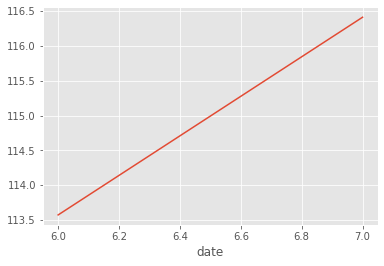

In [140]:
short_tweets_Ru['text'].str.len().groupby(by=short_tweets_Ru.index.month).mean().plot()

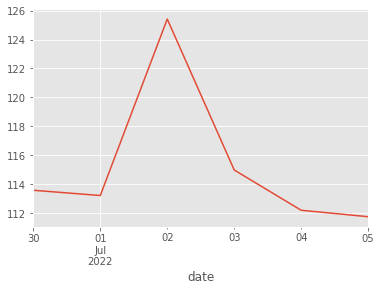

In [141]:
short_tweets_Ru['text'].str.len().resample('D').mean().plot() 

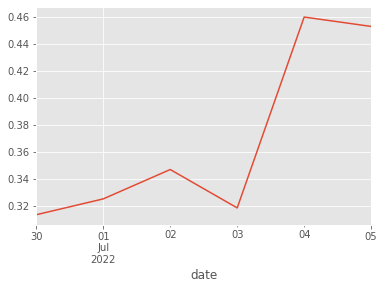

In [142]:
short_tweets_Ru['positivity'].resample('D').mean().plot() 

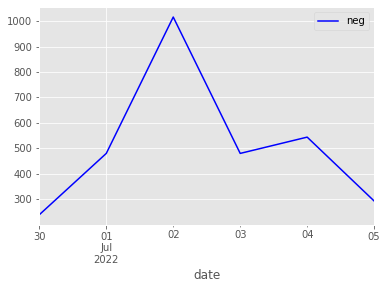

In [143]:
short_tweets_Ru['negative'].resample('D').sum().plot(color = 'b',label = 'neg').legend() 

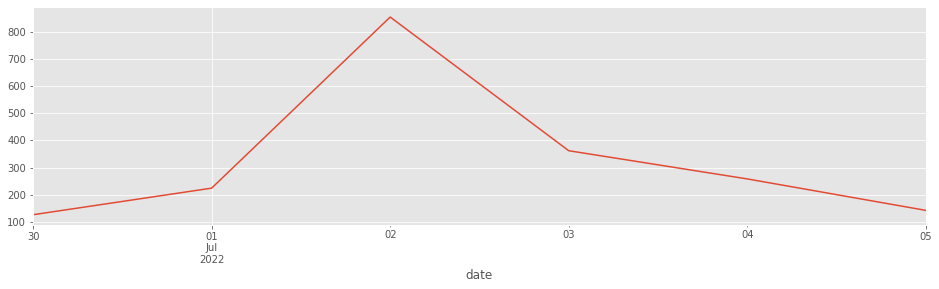

In [144]:
short_tweets_Ru['anger'].resample('D').sum().plot(figsize=(16,4))

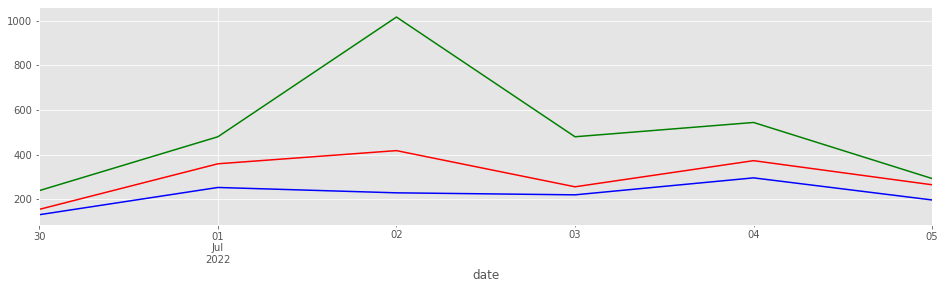

In [145]:
ax = short_tweets_Ru['positivity'].resample('D').sum().plot(figsize=(16,4), color = 'red')
short_tweets_Ru['negative'].resample('D').sum().plot(figsize=(16,4), ax = ax, color = 'green')
short_tweets_Ru['trust'].resample('D').sum().plot(figsize=(16,4), ax = ax, color = 'blue')

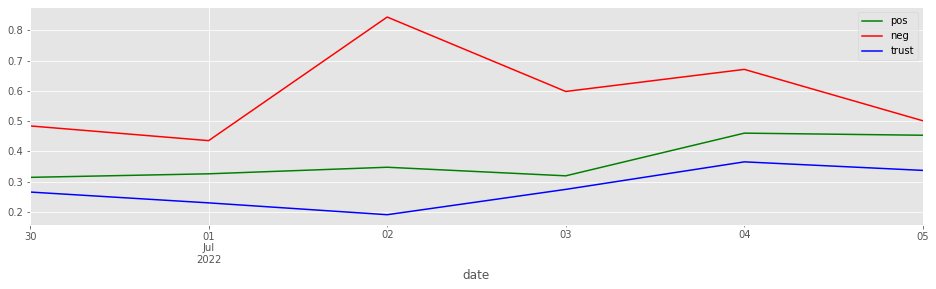

In [146]:
ax = short_tweets_Ru['positivity'].resample('D').mean().plot(figsize=(16,4), 
                                                          color = 'g', label='pos')
short_tweets_Ru['negative'].resample('D').mean().plot(figsize=(16,4), ax = ax, 
                                                   label = 'neg', color = 'r')
short_tweets_Ru['trust'].resample('D').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'trust',color = 'blue').legend()

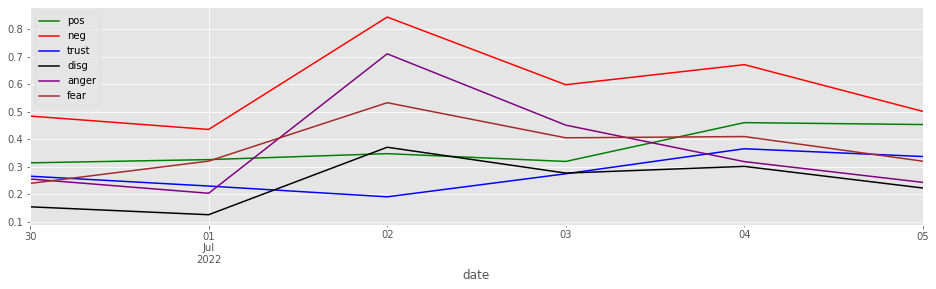

In [147]:
plt.style.use('ggplot')
ax = short_tweets_Ru['positivity'].resample('D').mean().plot(figsize=(16,4), 
                                                          color = 'g', label='pos')
short_tweets_Ru['negative'].resample('D').mean().plot(figsize=(16,4), ax = ax, 
                                                   label = 'neg', color = 'r')
short_tweets_Ru['trust'].resample('D').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'trust',color = 'blue').legend()

short_tweets_Ru['disgust'].resample('D').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'disg',color = 'black').legend() 

short_tweets_Ru['anger'].resample('D').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'anger',color = 'purple').legend() 

short_tweets_Ru['fear'].resample('D').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'fear',color = 'brown').legend()    

Text(0, 0.5, 'Hour of the day')

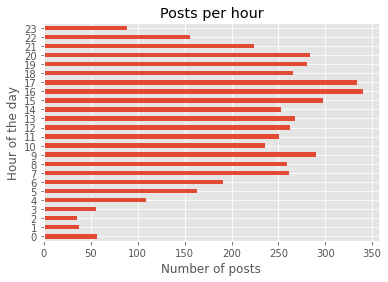

In [148]:
short_tweets_Ru['text'].groupby(by=short_tweets_Ru.index.hour).count().plot(kind='barh')
plt.title("Posts per hour")
plt.xlabel("Number of posts")
plt.ylabel("Hour of the day")

In [149]:
short_tweets_Ru

,text,year,month,day,anger,positivity,joy,disgust,surprise,trust,anticipation,sadness,negative,fear
date,,,,,,,,,,,,,,
2022-07-05 17:50:23,ΟΙ ΕΥΡΩΠΑΙΟΙ ΗΓΕΤΕΣ ΕΓΚΛΗΜΑΤΟΥΝ ΚΑΤΑ ΤΩΝ ΛΑΩΝ ...,2022,7,5,0,0,0,0,0,0,0,0,0,0
2022-07-05 17:48:59,RT @ManGiannarakis: Ο Ερντογάν θα επισκεφθεί τ...,2022,7,5,0,0,0,0,0,0,0,0,0,0
2022-07-05 17:48:07,@manosxatzid @BabeufGr @lathranagnosti1 @deli_...,2022,7,5,0,1,1,0,0,1,1,0,0,0
2022-07-05 17:46:25,Γιώργος Ρωμανός: Η Ρωσία έτοιμη να πάρει το 40...,2022,7,5,0,0,0,0,0,0,0,0,0,0
2022-07-05 17:44:14,RT @euro2day_gr: Κλείνει η εβραϊκή υπηρεσία στ...,2022,7,5,0,0,0,0,1,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-30 15:42:39,RT @in_gr: Ρωσία: Μαχητές του τάγματος Αζόφ θα...,2022,6,30,0,1,0,0,0,1,0,0,1,0
2022-06-30 15:40:53,RT @entimos3: Η Γερμανία σε φούλ καύση λιγνίτη...,2022,6,30,0,0,0,0,0,0,0,0,2,0
2022-06-30 15:40:02,RT @NikosMichael6: Στη Ρωσία η Δούμα ψήφισε νό...,2022,6,30,1,2,1,1,1,1,1,2,2,1


# Rudf - Ukdf

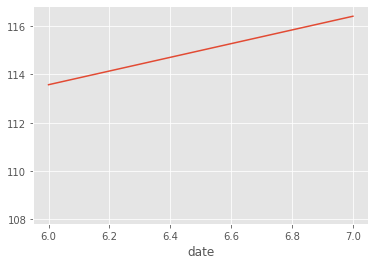

In [150]:
short_tweets_Ru['text'].str.len().groupby(by=short_tweets_Ru.index.month).mean().plot()
short_tweets_Ukr['text'].str.len().groupby(by=short_tweets_Ukr.index.month).mean().plot()

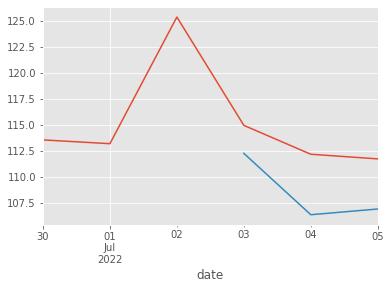

In [151]:
short_tweets_Ru['text'].str.len().resample('D').mean().plot() 
short_tweets_Ukr['text'].str.len().resample('D').mean().plot() 

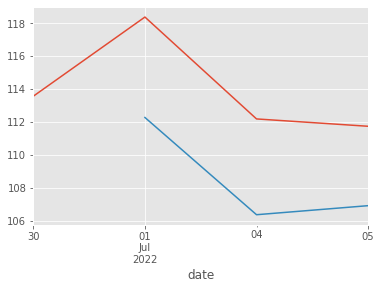

In [152]:
short_tweets_Ru['text'].str.len().resample('B').mean().plot() 
short_tweets_Ukr['text'].str.len().resample('B').mean().plot() 

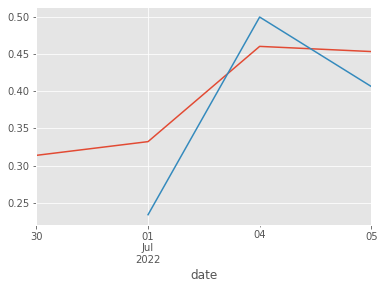

In [153]:
short_tweets_Ru['positivity'].resample('B').mean().plot() 
short_tweets_Ukr['positivity'].resample('B').mean().plot() 

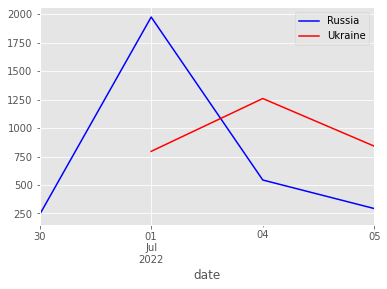

In [154]:
short_tweets_Ru['negative'].resample('B').sum().plot(color = 'b',label = 'Russia').legend() 
short_tweets_Ukr['negative'].resample('B').sum().plot(color = 'r',label = 'Ukraine').legend() 

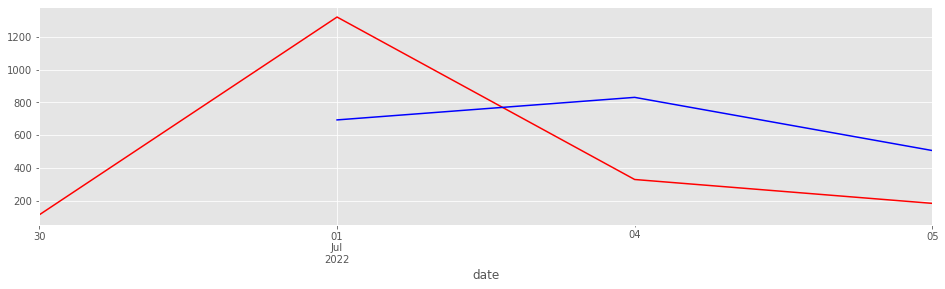

In [155]:
short_tweets_Ru['fear'].resample('B').sum().plot(figsize=(16,4), color = 'red')
short_tweets_Ukr['fear'].resample('B').sum().plot(figsize=(16,4), color = 'blue')

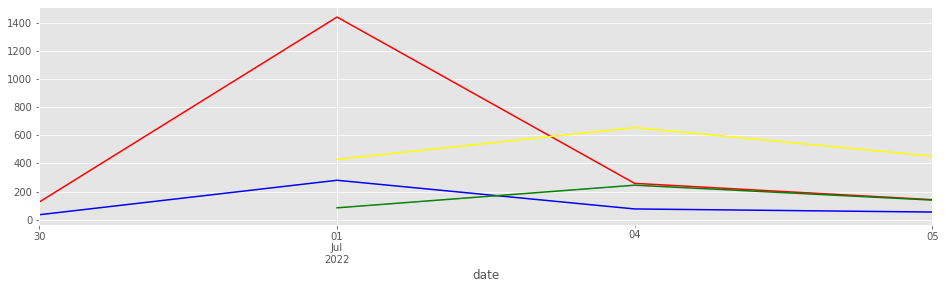

In [156]:
ax = short_tweets_Ru['anger'].resample('B').sum().plot(figsize=(16,4), color = 'red')
short_tweets_Ru['joy'].resample('B').sum().plot(figsize=(16,4), ax = ax, color = 'blue')
ax = short_tweets_Ukr['anger'].resample('B').sum().plot(figsize=(16,4), color = 'yellow')
short_tweets_Ukr['joy'].resample('B').sum().plot(figsize=(16,4), ax = ax, color = 'green')

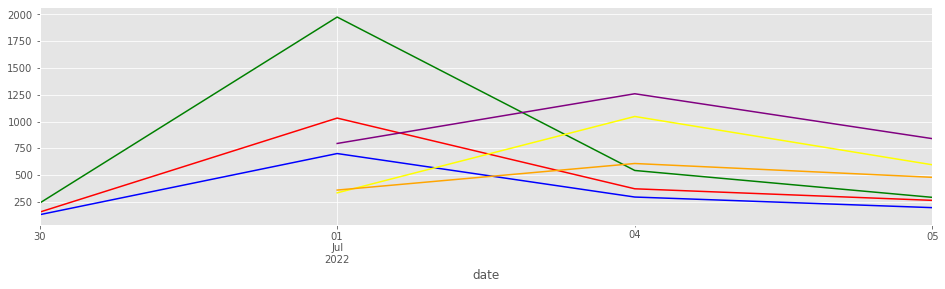

In [157]:
ax = short_tweets_Ru['positivity'].resample('B').sum().plot(figsize=(16,4), color = 'red')
short_tweets_Ru['negative'].resample('B').sum().plot(figsize=(16,4), ax = ax, color = 'green')
short_tweets_Ru['trust'].resample('B').sum().plot(figsize=(16,4), ax = ax, color = 'blue')
ax = short_tweets_Ukr['positivity'].resample('B').sum().plot(figsize=(16,4), color = 'yellow')
short_tweets_Ukr['negative'].resample('B').sum().plot(figsize=(16,4), ax = ax, color = 'purple')
short_tweets_Ukr['trust'].resample('B').sum().plot(figsize=(16,4), ax = ax, color = 'orange')

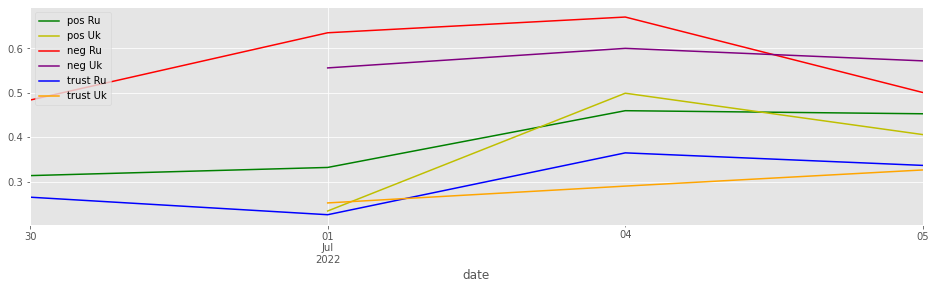

In [158]:
ax = short_tweets_Ru['positivity'].resample('B').mean().plot(figsize=(16,4), 
                                                          color = 'g', label='pos Ru')
ax = short_tweets_Ukr['positivity'].resample('B').mean().plot(figsize=(16,4), 
                                                          color = 'y', label='pos Uk')
short_tweets_Ru['negative'].resample('B').mean().plot(figsize=(16,4), ax = ax, 
                                                   label = 'neg Ru', color = 'r')
short_tweets_Ukr['negative'].resample('B').mean().plot(figsize=(16,4), ax = ax, 
                                                   label = 'neg Uk', color = 'purple')
short_tweets_Ru['trust'].resample('B').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'trust Ru',color = 'blue').legend()
short_tweets_Ukr['trust'].resample('B').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'trust Uk',color = 'orange').legend()

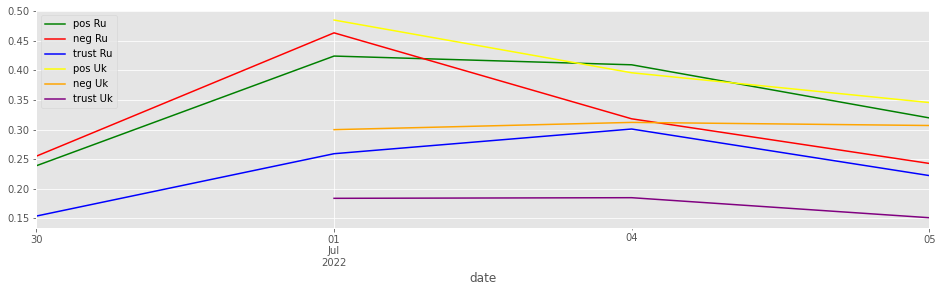

In [159]:
plt.style.use('ggplot')
ax = short_tweets_Ru['fear'].resample('B').mean().plot(figsize=(16,4), 
                                                          color = 'g', label='pos Ru')
short_tweets_Ru['anger'].resample('B').mean().plot(figsize=(16,4), ax = ax, 
                                                   label = 'neg Ru', color = 'r')
short_tweets_Ru['disgust'].resample('B').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'trust Ru',color = 'blue').legend()    
short_tweets_Ukr['fear'].resample('B').mean().plot(figsize=(16,4), 
                                                          color = 'yellow', label='pos Uk')
short_tweets_Ukr['anger'].resample('B').mean().plot(figsize=(16,4), ax = ax, 
                                                   label = 'neg Uk', color = 'orange')
short_tweets_Ukr['disgust'].resample('B').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'trust Uk',color = 'purple').legend()                                                